# <div align="center">바다레인저</div>
---

# 목차

1. [도입](#1-도입)


2. [전처리](#2-전처리)


3. [분석](#3-분석)

    3.1. [탐색적 데이터 분석](#3-1-탐색적-데이터-분석)
    
    3.2. [바다숲 조성 전후 비교](#3-2-바다숲-조성-전후-비교)
    

4. [개선안 및 제안](#4-개선안-및-제안)

    4.1. [개선안](#4-1-개선안)

    4.2. [제안](#4-2-제안)

    4.3. [참조문헌](#4-3-참조문헌)
    

5. [결론](#5-결론)

# 1 도입
---

## 1.1 주제

### 1.1.1 선정 배경

연안 해역은 바다면적의 0.6%에 불과하지만 우리에게 많은 이로움을 줍니다. 해조류에 의한 탄소흡수는 열대우림에서 흡수하는 양에 비해 5배 가량 높은 효율을 갖고 있으며, 오염물질의 정화, 비타민·미네랄 등 의약품과 산업용 기능성 물질의 추출, 바이오에너지원 등의 미래가치가 큽니다.
    
하지만, 이런 연안 해역은 최근 갯녹음에 의해 바다 사막화가 발생하고 있습니다. 갯녹음이란, 해수 온도의 상승과 해수 산성화, 해양환경오염, 성게, 전복 등의 조식성 동물의 식해 등으로 인해 바다가 사막처럼 변하는 현상을 뜻합니다. 이런 갯녹음은 1970년 처음 발견된것을 기점으로 매년 약 1200ha의 면적이 확장되고 있으며, 현재 동해 51%, 남해 33% 제주 35%의 암반에서 진행 중이거나 심각한 상황으로 알려졌습니다.
    
이를 해결할 방법으로 제시된 것이 몽골의 사막화를 해결하기 위해 나무를 심듯 인위적으로 해조를 심어 바다에 숲을 가꾸는 것입니다. 이것을 바다숲이라고 합니다. 이러한 바다숲은 바다생태계의 근간이 되며, 1000만종 이상의 생물과 바다 생물량의 70%가 바다숲에서 나고 살나갑니다.
    
하지만 이런 바다숲은 위치에 많은 제약이 따릅니다. 염분, 투명도, 설치장소, 수온, 수심, 영양분 등 다양한 요소가 고려되어야 합니다. 이를 사람이 확인하려면 많은 시간과 공수가 소모되며, 예상치 못한 문제나 고려하지 못한 사안들이 발생할 수 있습니다.
    
그래서 저희는 JOISS의 방대한 데이터와 이미 설치된 바다숲 데이터를 활용하여 그들 간의 변화를 통해 관계를 찾아 적합한 설치 위치를 찾을 수 있도록하는 것이 목적입니다.


## 1.2 활용 데이터셋

- 정선해양관측 (2004년~2020년,  [JOISS 관할해역 해양정보 공동활용시스템](https://joiss.kr/joiss/srch.tot.JoissTotalSearchService.do))
- 해양환경측정망 (2004년~2020년, [JOISS 관할해역 해양정보 공동활용시스템](https://joiss.kr/joiss/srch.tot.JoissTotalSearchService.do))
- 바다숲 조성현황 ([한국수산자원공단](https://www.fira.or.kr))


# 2 전처리
---

전처리는 다음을 수행합니다.

- "해역" 추가 : 바다숲 데이터를 바탕으로 각 데이터의 해역을 k-NN 모델링으로 추정하여 입력합니다.
- "연도", "월", "연월" 추가 : 시계열 분석 용도

In [1]:
# 필요한 패키지 및 종속성 설치
import subprocess, sys

reqs = subprocess.check_output([sys.executable, '-m', 'pip', 'freeze'])
installed_packages = [r.decode().split('==')[0] for r in reqs.split()]

for package_name in ['geopy', 'lightgbm', 'plotly']:
    if package_name not in installed_packages:
        !pip install -Uq {package_name}

# 패키지 로드
import pandas as pd                                                                                          # 분석
import numpy as np                                                                                          # 분석
from sklearn.neighbors import KNeighborsClassifier                                                  # k-NN
from sklearn.model_selection import cross_val_score, KFold, GridSearchCV, train_test_split  # 모델링
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder                                              # 전처리
from geopy.distance import geodesic                                                                    # 좌표간 거리 계산
import lightgbm as lgb                                                                                      # ML - LightGBM
from tensorflow import keras
from sklearn.metrics import r2_score
from keras.models import Sequential
from keras.layers import Dense, LSTM
import plotly.express as px                                                                                 # 시각화 - Plotly
import plotly.io as pio                                                                                       # 시각화 - Plotly
import matplotlib.pyplot as plt                                                                            # 시각화
import seaborn as sns                                                                                       # 시각화
import glob, os, re                                                                                            # 공통
from datetime import datetime                                                                           # 공통
from IPython.core.display import display, HTML                                                      # 공통 - 노트북 너비

# 전역 설정
display(HTML("<style>.container { width:70% !important; }</style>"))                            # 노트북 너비
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['figure.figsize'] = (22, 10)
plt.rcParams['axes.unicode_minus']=False
pio.templates.default = "ggplot2"                                                                          # Plotly 테마
pio.renderers.default = "notebook_connected"

In [2]:
# 사용자 클래스 - 공통
class CustomUtils:
    """
    자주 사용되는 메소드를 담은 사용자 클래스입니다.
    """
    
    @classmethod
    def display_htmls(_cls, *args, orientation='h'):
        """복수의 html을 한 행에 출력합니다."""
        from IPython.display import display_html

        display_style = orientation=='h' and 'flex' or 'block'
        html_str = f'<div style="display:{display_style};justify-content:space-around;align-items:center;">'
        for html_src in args:
            html_str += '<div>' + html_src + '</div>'
        html_str += '</div>'
        display_html(html_str, raw=True)
    
    @classmethod
    def jpeg_binary_to_img_src(_cls, jpeg_binary=None):
        """바이너리 타입의 이미지 데이터를 받아 img tag롤 반환합니다."""
        from binascii import b2a_base64
        
        b64_data = b2a_base64(jpeg_binary).decode('ascii')
        return f"<img src='data:image/jpeg;base64,{b64_data}'>"
    
    @classmethod
    def predict_by_knn(_cls, x_train, y_train, x_test):
        """k-NN 알고리즘으로 y_test를 예측합니다."""
        # 최적의 n값 구하기
        k_fold = KFold(n_splits=10, shuffle=True)
        cv_scores = []
        for n in range(1, 10, 2):
            knn = KNeighborsClassifier(n_neighbors=n)
            scores = cross_val_score(knn, x_train, y_train, cv=k_fold, scoring='accuracy')
            cv_scores.append((n, scores.mean()))
        n_best = max(cv_scores, key=lambda x: x[-1])[0]
        # KNN 모델링
        knn = KNeighborsClassifier(n_neighbors=n_best)
        knn.fit(x_train, y_train)
        return knn.predict(x_test)
    
    @classmethod
    def predict_lgbr(_cls, X_train, y_train, X_test, param_grid={}, param_gs={}):
        """LightGBM Regressor를 실행하고 결과를 출력, 베스트 모델로 예측한 값을 반환합니다."""
        from datetime import datetime
        
        print('* Start modeling at', datetime.now().replace(microsecond=0))
        gs = GridSearchCV(estimator=lgb.LGBMRegressor(random_state=2021), param_grid=param_grid, **param_gs)
        gs.fit(X_train, y_train)
        print('* Start predicting at', datetime.now().replace(microsecond=0))
        pred = gs.predict(X_test)
        print('* Best params : ', gs.best_params_)
        print('* Score : ', gs.best_score_)
        print('* End predicting at', datetime.now().replace(microsecond=0))
        return pred
    
    @classmethod
    def show_df_short(_cls, df):
        display(df.tail(5))
        display(df.shape)

    @classmethod
    def strip_fn(_cls, text):
        """문자열 전후 공백을 제거합니다."""
        try:
            return text.strip()
        except AttributeError:
            return text


데이터 수집

가용한 총 567개<sup>[(1)](#footnote_3233a)</sup>의 JOISS 데이터 별 활용 여부를 분류하였으며, 주요 데이터셋 분류 결과는 다음과 같습니다.

분석 및 모델링 활용
- 정선해양관측 : 연안 데이터는 부족하지만, 수심(m)과 관심 변수들이 있음. 분 단위.
- 해양환경측정망 : 수심(m)과 관심 변수들이 있음. 분 단위.

제외
- 종합해양과학기지 : 관측 위치가 먼바다로 본 주제와 관련성 낮음.
- 해양과학기지 : 관측 위치가 먼바다로 본 주제와 관련성 낮음.
- 해양기상부이 : 해양 기상 데이터로 본 주제와 관련성이 낮으며 수면 데이터만 있음. (수심(m) x)
- 해양수질자동측정망 : 강 하구 수질 측정 데이터로 관측지점이 28개소 육지 인접에 한정. 제주 해역 없음.


<sub><a name='footnote_3233b'>(1)</a> 2021년 10월 19일 09시 기준 (KST), 중복 1건 (연안정지관측자료_2018_profile_meteorological_unknown) 제외</sub>


바다숲 조성사업 현황, 정선해양관측, 해양환경측정망의 전처리를 수행하였습니다.


In [3]:
# 필요시 전처리 완료된 데이터 로드합니다.
is_load_processed = True
if is_load_processed:
    mf1_all_df = pd.read_csv('data/mf1_all.zip', dtype={'해역': 'category', '년도': 'int16', '광역시도': 'category'})
    coldtypes = {'project_name': 'category', 'station': 'category', '계절': 'category', '분기': 'category', '수심(text)': str, 
                     '연도': 'int16', '월': 'category', '해역': 'category'}
    rtu_all_df = pd.read_csv('data/rtu_all.zip', dtype=coldtypes, parse_dates=['일시'])
    rtu_all_df

# 바다숲 데이터 전처리

In [4]:
# 변수 초기화
loaded_df, mf1_all_df = None, None

데이터 파일을 로드합니다. 모든 시트를 로드하며, 위도와 경도값의 선행/후행 공백을 제거합니다.

In [5]:
raw_filename = sorted(glob.glob('data/raw/요청자료1*.xlsx'))[0]
loaded_df = pd.read_excel(raw_filename, sheet_name=None, converters={'위도': CustomUtils.strip_fn, '경도': CustomUtils.strip_fn}, usecols=[0, 1, 2, 4, 5, 6])
loaded_df.keys()

dict_keys(['2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020'])

이어서 다음의 데이터 전처리를 수행합니다.
- 연도별 시트로 구분된 엑셀 데이터를 하나의 데이터프레임으로 합칩니다.
- 셀 병합이 되어있던 데이터들의 값을 채워줍니다.
- 적절한 데이터 타입을 지정합니다.

In [6]:
dtypes = {'년도': 'int16', '해역': 'category', '광역시도': 'category'}
mf1_all_df = pd.concat(loaded_df, ignore_index=True).fillna(method='ffill').astype(dtypes)
mf1_all_df

,해역,년도,광역시도,면적(ha),위도,경도
0,동해,2009,강원도,40.00,37° 49.532',128° 53.009'
1,동해,2009,강원도,40.00,37° 49.691',128° 53.267'
2,동해,2009,강원도,40.00,37° 49.146',128° 53.493'
3,동해,2009,강원도,40.00,37° 49.323',128° 53.736'
4,동해,2009,경상북도,35.00,35° 52.961',129° 31.795'
...,...,...,...,...,...,...
1227,제주,2020,제주도,161.05,33° 31.500',126° 34.500'
1228,제주,2020,제주도,161.62,33° 13.500',126° 27.000'
1229,제주,2020,제주도,161.62,33° 14.250',126° 27.000'
1230,제주,2020,제주도,161.62,33° 13.500',126° 27.750'


해역 열을 살펴보겠습니다.

In [7]:
mf1_all_df['해역'].value_counts()

동해     431
남해     331
제주     257
서해     191
제주도     14
서헤       8
Name: 해역, dtype: int64

서해와 제주의 표현을 일원화 해줍니다.

In [8]:
mf1_all_df['해역'].replace({'서헤': '서해', '제주도': '제주'}, inplace=True)
mf1_all_df['해역'].value_counts()

동해    431
남해    331
제주    271
서해    199
Name: 해역, dtype: int64

위도, 경도 열을 살펴보겠습니다.

In [9]:
CustomUtils.display_htmls(mf1_all_df['위도'].to_frame().head().to_html(), mf1_all_df['위도'].to_frame().tail().to_html(),
                          mf1_all_df['경도'].to_frame().head().to_html(), mf1_all_df['경도'].to_frame().tail().to_html())

,위도
0,37° 49.532'
1,37° 49.691'
2,37° 49.146'
3,37° 49.323'
4,35° 52.961'
,위도
1227,33° 31.500'
1228,33° 13.500'
1229,33° 14.250'
1230,33° 13.500'


좌표의 '도' 단위가 모두 제 위치에 있는지 확인해보겠습니다.

In [10]:
CustomUtils.display_htmls(mf1_all_df['위도'].astype(str).str[2].value_counts().to_frame().to_html(),
                                  mf1_all_df['위도'].astype(str).str[-1].value_counts().to_frame().to_html(),
                                  mf1_all_df['경도'].astype(str).str[3].value_counts().to_frame().to_html(),
                                  mf1_all_df['경도'].astype(str).str[-1].value_counts().to_frame().to_html())

,위도
°,1232
,위도
',1196
′,36
,경도
°,1232
,경도
',1196
′,36


In [11]:
display(mf1_all_df['위도'].astype(str).str[-1].unique())

array(["'", '′'], dtype=object)

In [12]:
# 좌표단위 변환 ("도분"->"도")
pat = '° '
dm_to_d = lambda x: int(x[:-1].split('.', 1)[0]) + round(float(x[:-1].split('.', 1)[1]) / 60, 5)
mf1_all_df['위도'] = mf1_all_df['위도'].str.replace(pat, '.', regex=True).apply(dm_to_d)
mf1_all_df['경도'] = mf1_all_df['경도'].str.replace(pat, '.', regex=True).apply(dm_to_d)

In [13]:
mf1_all_df['경도'].astype(str).str[3].value_counts()

.    1232
Name: 경도, dtype: int64

전처리를 매 번 반복하지 않도록 파일로 저장합니다.

In [14]:
mf1_all_df.to_csv('data/mf1_all.zip', index=False)

전처리가 완료된 바다숲 데이터는 다음과 같습니다.

In [15]:
CustomUtils.display_htmls(mf1_all_df.head(5).to_html(), mf1_all_df.tail(5).to_html(), mf1_all_df.describe().round(3).to_html(), orientation='h')

,해역,년도,광역시도,면적(ha),위도,경도
0,동해,2009,강원도,40.0,37.82553,128.88348
1,동해,2009,강원도,40.0,37.82818,128.88778
2,동해,2009,강원도,40.0,37.81910,128.89155
3,동해,2009,강원도,40.0,37.82205,128.89560
4,동해,2009,경상북도,35.0,35.88268,129.52992
,해역,년도,광역시도,면적(ha),위도,경도
1227,제주,2020,제주도,161.05,33.5250,126.5750
1228,제주,2020,제주도,161.62,33.2250,126.4500
1229,제주,2020,제주도,161.62,33.2375,126.4500
1230,제주,2020,제주도,161.62,33.2250,126.4625


# 정선해양관측, 해양환경측정망 데이터 전처리

정선해양관측, 해양환경측정망 데이터도 전처리를 진행하겠습니다.

In [16]:
# 변수 초기화
loaded_df, rtu_all_df = None, None

coldtypes = {'project_name': 'category', 'station': 'category', '계절': 'category',
                 '너울등급_code': str, '너울방향_code': str, '분기': 'category', '수심(text)': str, '날씨_code': str, '수색_code': str,
                 '연도': 'int16', '운량_code': 'category', '운형_code': str, '월': 'category', '파도등급_code': str,
                 '파향_code': str, '풍력등급_code': str, '풍향_code': str, '해역': 'category'}

# 데이터 로드
raw_filenames = sorted(glob.glob('data/raw/*.zip'))
for raw_filename in raw_filenames:
    # 파일 로드
    loaded_df = pd.read_csv(raw_filename, encoding='cp949', skiprows=26, dtype=coldtypes, parse_dates=['yyyy-mm-dd hh:mm:ss'])
    # 데이터프레임에 추가
    rtu_all_df = pd.concat([rtu_all_df, loaded_df], ignore_index=True) if isinstance(rtu_all_df, pd.DataFrame) else loaded_df

rtu_all_df

,project_name,station,yyyy-mm-dd hh:mm:ss,Longitude [degrees_east],Latitude [degrees_north],bot.depth[m],수심(m),수심(text),염분[psu],sal_qc,...,화학적산소요구량[mg/L],cheoxydem_qc,암모니아성 질소[μg/L],amn_qc,유분[mg/L],fra_qc,총인[μg/L],totp_qc,부유물질 농도[mg/L],totdisn_qc
0,정선해양관측,102-00,2004-02-19 10:10:00,129.588300,36.076700,0.0,0.0,NaN,34.3230,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,정선해양관측,102-00,2004-02-19 10:10:00,129.588300,36.076700,0.0,10.0,NaN,34.4310,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,정선해양관측,102-00,2004-02-19 10:10:00,129.588300,36.076700,0.0,20.0,NaN,34.4390,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,정선해양관측,102-00,2004-02-19 10:10:00,129.588300,36.076700,0.0,30.0,NaN,34.4130,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,정선해양관측,102-00,2004-02-19 10:10:00,129.588300,36.076700,0.0,50.0,NaN,34.4310,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194313,해양환경측정망,강릉남대천하구1_연안,2020-11-26 10:23:00,128.956667,37.767500,NaN,6.0,저층,33.2655,1.0,...,1.47555,2.0,6.314,2.0,NaN,NaN,14.136,2.0,4.60,2.0
194314,해양환경측정망,삼덕항H1_항만,2020-02-19 11:42:00,128.381111,34.795278,NaN,0.0,표층,34.1498,1.0,...,2.10648,2.0,14.322,2.0,NaN,NaN,29.171,2.0,6.45,2.0
194315,해양환경측정망,삼덕항H1_항만,2020-02-19 11:42:00,128.381111,34.795278,NaN,10.0,저층,34.1349,1.0,...,1.64016,2.0,12.936,2.0,NaN,NaN,29.171,2.0,5.30,2.0
194316,해양환경측정망,삼덕항H1_항만,2020-08-19 13:34:00,128.381111,34.795278,NaN,0.0,표층,30.8708,1.0,...,2.02453,2.0,26.600,2.0,NaN,NaN,27.714,2.0,10.85,2.0


열 이름을 사용하기 편리하게 변경합니다.

In [17]:
colnames = {'yyyy-mm-dd hh:mm:ss': '일시', 'Longitude [degrees_east]': '경도', 'Latitude [degrees_north]': '위도'}
rtu_all_df.rename(columns=colnames, inplace=True)
CustomUtils.show_df_short(rtu_all_df)

,project_name,station,일시,경도,위도,bot.depth[m],수심(m),수심(text),염분[psu],sal_qc,...,화학적산소요구량[mg/L],cheoxydem_qc,암모니아성 질소[μg/L],amn_qc,유분[mg/L],fra_qc,총인[μg/L],totp_qc,부유물질 농도[mg/L],totdisn_qc
194313,해양환경측정망,강릉남대천하구1_연안,2020-11-26 10:23:00,128.956667,37.767500,NaN,6.0,저층,33.2655,1.0,...,1.47555,2.0,6.314,2.0,NaN,NaN,14.136,2.0,4.60,2.0
194314,해양환경측정망,삼덕항H1_항만,2020-02-19 11:42:00,128.381111,34.795278,NaN,0.0,표층,34.1498,1.0,...,2.10648,2.0,14.322,2.0,NaN,NaN,29.171,2.0,6.45,2.0
194315,해양환경측정망,삼덕항H1_항만,2020-02-19 11:42:00,128.381111,34.795278,NaN,10.0,저층,34.1349,1.0,...,1.64016,2.0,12.936,2.0,NaN,NaN,29.171,2.0,5.30,2.0
194316,해양환경측정망,삼덕항H1_항만,2020-08-19 13:34:00,128.381111,34.795278,NaN,0.0,표층,30.8708,1.0,...,2.02453,2.0,26.600,2.0,NaN,NaN,27.714,2.0,10.85,2.0
194317,해양환경측정망,삼덕항H1_항만,2020-08-19 13:34:00,128.381111,34.795278,NaN,6.5,저층,32.7535,1.0,...,2.33160,2.0,6.860,2.0,NaN,NaN,31.713,2.0,10.90,2.0


(194318, 52)

사용하지 않는 열을 제거합니다.

In [18]:
rtu_all_df.drop(columns=['station', 'bot.depth[m]', 'dep_flag', '유효시간'], inplace=True, errors='ignore')
CustomUtils.show_df_short(rtu_all_df)

,project_name,일시,경도,위도,수심(m),수심(text),염분[psu],sal_qc,수온[℃],wtrtmp_qc,...,화학적산소요구량[mg/L],cheoxydem_qc,암모니아성 질소[μg/L],amn_qc,유분[mg/L],fra_qc,총인[μg/L],totp_qc,부유물질 농도[mg/L],totdisn_qc
194313,해양환경측정망,2020-11-26 10:23:00,128.956667,37.767500,6.0,저층,33.2655,1.0,14.6281,1.0,...,1.47555,2.0,6.314,2.0,NaN,NaN,14.136,2.0,4.60,2.0
194314,해양환경측정망,2020-02-19 11:42:00,128.381111,34.795278,0.0,표층,34.1498,1.0,11.4495,1.0,...,2.10648,2.0,14.322,2.0,NaN,NaN,29.171,2.0,6.45,2.0
194315,해양환경측정망,2020-02-19 11:42:00,128.381111,34.795278,10.0,저층,34.1349,1.0,11.2831,1.0,...,1.64016,2.0,12.936,2.0,NaN,NaN,29.171,2.0,5.30,2.0
194316,해양환경측정망,2020-08-19 13:34:00,128.381111,34.795278,0.0,표층,30.8708,1.0,24.4586,1.0,...,2.02453,2.0,26.600,2.0,NaN,NaN,27.714,2.0,10.85,2.0
194317,해양환경측정망,2020-08-19 13:34:00,128.381111,34.795278,6.5,저층,32.7535,1.0,19.4610,1.0,...,2.33160,2.0,6.860,2.0,NaN,NaN,31.713,2.0,10.90,2.0


(194318, 48)

바다숲은 연안에 조성되므로 먼 바다의 데이터는 제외합니다.

In [19]:
rtu_all_df = rtu_all_df[( 32.9 < rtu_all_df['위도']) & (rtu_all_df['위도'] <  39.0) & (124.5 < rtu_all_df['경도']) & (rtu_all_df['경도'] < 132.5)]
CustomUtils.show_df_short(rtu_all_df)

,project_name,일시,경도,위도,수심(m),수심(text),염분[psu],sal_qc,수온[℃],wtrtmp_qc,...,화학적산소요구량[mg/L],cheoxydem_qc,암모니아성 질소[μg/L],amn_qc,유분[mg/L],fra_qc,총인[μg/L],totp_qc,부유물질 농도[mg/L],totdisn_qc
194313,해양환경측정망,2020-11-26 10:23:00,128.956667,37.767500,6.0,저층,33.2655,1.0,14.6281,1.0,...,1.47555,2.0,6.314,2.0,NaN,NaN,14.136,2.0,4.60,2.0
194314,해양환경측정망,2020-02-19 11:42:00,128.381111,34.795278,0.0,표층,34.1498,1.0,11.4495,1.0,...,2.10648,2.0,14.322,2.0,NaN,NaN,29.171,2.0,6.45,2.0
194315,해양환경측정망,2020-02-19 11:42:00,128.381111,34.795278,10.0,저층,34.1349,1.0,11.2831,1.0,...,1.64016,2.0,12.936,2.0,NaN,NaN,29.171,2.0,5.30,2.0
194316,해양환경측정망,2020-08-19 13:34:00,128.381111,34.795278,0.0,표층,30.8708,1.0,24.4586,1.0,...,2.02453,2.0,26.600,2.0,NaN,NaN,27.714,2.0,10.85,2.0
194317,해양환경측정망,2020-08-19 13:34:00,128.381111,34.795278,6.5,저층,32.7535,1.0,19.4610,1.0,...,2.33160,2.0,6.860,2.0,NaN,NaN,31.713,2.0,10.90,2.0


(178586, 48)

데이터 품질값이 1~2인 값만 남기고 나머지는 NaN으로 대체합니다.

In [20]:
rtu_all_df

,project_name,일시,경도,위도,수심(m),수심(text),염분[psu],sal_qc,수온[℃],wtrtmp_qc,...,화학적산소요구량[mg/L],cheoxydem_qc,암모니아성 질소[μg/L],amn_qc,유분[mg/L],fra_qc,총인[μg/L],totp_qc,부유물질 농도[mg/L],totdisn_qc
0,정선해양관측,2004-02-19 10:10:00,129.588300,36.076700,0.0,NaN,34.3230,1.0,10.9800,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,정선해양관측,2004-02-19 10:10:00,129.588300,36.076700,10.0,NaN,34.4310,1.0,11.0100,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,정선해양관측,2004-02-19 10:10:00,129.588300,36.076700,20.0,NaN,34.4390,1.0,11.0100,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,정선해양관측,2004-02-19 10:10:00,129.588300,36.076700,30.0,NaN,34.4130,1.0,10.7200,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,정선해양관측,2004-02-19 10:10:00,129.588300,36.076700,50.0,NaN,34.4310,1.0,10.6800,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194313,해양환경측정망,2020-11-26 10:23:00,128.956667,37.767500,6.0,저층,33.2655,1.0,14.6281,1.0,...,1.47555,2.0,6.314,2.0,NaN,NaN,14.136,2.0,4.60,2.0
194314,해양환경측정망,2020-02-19 11:42:00,128.381111,34.795278,0.0,표층,34.1498,1.0,11.4495,1.0,...,2.10648,2.0,14.322,2.0,NaN,NaN,29.171,2.0,6.45,2.0
194315,해양환경측정망,2020-02-19 11:42:00,128.381111,34.795278,10.0,저층,34.1349,1.0,11.2831,1.0,...,1.64016,2.0,12.936,2.0,NaN,NaN,29.171,2.0,5.30,2.0
194316,해양환경측정망,2020-08-19 13:34:00,128.381111,34.795278,0.0,표층,30.8708,1.0,24.4586,1.0,...,2.02453,2.0,26.600,2.0,NaN,NaN,27.714,2.0,10.85,2.0


In [21]:
rtu_all_df = rtu_all_df.copy()
qc_cols = [(idx, col) for idx, col in enumerate(rtu_all_df.columns) if col.endswith('_qc')]
for idx, col in qc_cols:
    obs_df = rtu_all_df.iloc[:, [idx - 1, idx]].copy()
    obs_df.iloc[~obs_df.iloc[:, 1].isin([1, 2]), 0] = np.nan
    col_value = rtu_all_df.columns[idx - 1]
    rtu_all_df[col_value] = obs_df.iloc[:, 0]

데이터 품질 열을 제외합니다.

In [22]:
qc_cols = [col for col in rtu_all_df.columns if col.endswith('_qc')]
rtu_all_df.drop(columns=qc_cols, inplace=True)

두 개의 다른 데이터셋이 합쳐졌기에, 일시, 좌표, 수심을 기준으로 그룹화 합니다. 중복되는 행은 열 별로 결측치를 제외한 평균을 적용해 줍니다.

In [23]:
rtu_all_df = rtu_all_df.groupby(['일시', '경도', '위도', '수심(m)']).mean().reset_index()
rtu_all_df.notna().sum().to_frame().T

,일시,경도,위도,수심(m),염분[psu],수온[℃],용존산소[mg/L],규산염[μM],아질산성질소[μM],인산염인[μM],...,규산염[μg/L],아질산성질소[μg/L],인산염인[μg/L],질산성질소[μg/L],용존무기질소[μg/L],화학적산소요구량[mg/L],암모니아성 질소[μg/L],유분[mg/L],총인[μg/L],부유물질 농도[mg/L]
0,178585,178585,178585,178585,177545,178375,142338,29759,29132,29242,...,46065,46065,46065,46065,46065,46065,46065,82,46065,3230


IQR 방식으로 이상치를 제거해줍니다.

In [24]:
# 이상값 제거
q1 = rtu_all_df.quantile(.25)
q3 = rtu_all_df.quantile(.75)
iqr = q3 - q1

cols = rtu_all_df.select_dtypes('number').columns
rtu_all_df = rtu_all_df[~((rtu_all_df[cols] < (q1 - 1.5 * iqr)) | (rtu_all_df[cols] > (q3 + 1.5 * iqr))).any(axis=1)]
rtu_all_df

,일시,경도,위도,수심(m),염분[psu],수온[℃],용존산소[mg/L],규산염[μM],아질산성질소[μM],인산염인[μM],...,규산염[μg/L],아질산성질소[μg/L],인산염인[μg/L],질산성질소[μg/L],용존무기질소[μg/L],화학적산소요구량[mg/L],암모니아성 질소[μg/L],유분[mg/L],총인[μg/L],부유물질 농도[mg/L]
0,2004-01-29 11:30:00,129.1200,35.0217,0.0,34.0950,13.0400,6.05,15.41,0.09,0.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2004-01-29 11:30:00,129.1200,35.0217,10.0,34.0720,12.7800,6.00,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2004-01-29 11:30:00,129.1200,35.0217,20.0,34.1060,12.4600,6.15,17.48,0.13,0.57,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2004-01-29 11:30:00,129.1200,35.0217,30.0,34.0510,12.0700,6.15,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2004-01-29 11:30:00,129.1200,35.0217,50.0,34.0260,12.0100,6.14,16.01,0.21,0.50,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178580,2020-12-22 11:00:00,126.5667,34.0333,0.0,33.0741,13.2068,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
178581,2020-12-22 11:00:00,126.5667,34.0333,10.0,33.0722,13.1973,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
178582,2020-12-22 11:00:00,126.5667,34.0333,20.0,33.0763,13.2151,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
178583,2020-12-22 11:00:00,126.5667,34.0333,30.0,33.0964,13.2854,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


이어서 분석에 필요한 파생변수들을 생성하겠습니다.

먼저 해역 열을 추가합니다. 해역은 위 바다숲 데이터의 정규화 된 좌표와 해역을 바탕으로 k-최근접 이웃 알고리즘(k-NN)을 이용합니다.

In [25]:
scaler = MinMaxScaler()
scaler.fit(pd.concat([mf1_all_df[['위도', '경도']], rtu_all_df[['위도', '경도']]], ignore_index=True))
mf1_scaled = scaler.transform(mf1_all_df[['위도', '경도']])
rtu_scaled = scaler.transform(rtu_all_df[['위도', '경도']])
rtu_all_df['해역'] = CustomUtils.predict_by_knn(mf1_scaled, mf1_all_df['해역'], rtu_scaled)
rtu_all_df['해역'].value_counts()

동해    66885
남해    26116
제주    23360
서해    20495
Name: 해역, dtype: int64

여러 단위로 보기 위해 일자를 바탕으로 시계열 파생 변수들을 생성합니다. 관측값의 연속성을 관찰하기 위해 '경과' 컬럼을 추가하되, 분 단위로 하였습니다.

In [26]:
rtu_all_df['연도'] = rtu_all_df['일시'].dt.year
rtu_all_df['월'] = rtu_all_df['일시'].dt.month
rtu_all_df['연월'] = rtu_all_df['일시'].dt.strftime('%Y%m')
rtu_all_df['경과_분'] = (rtu_all_df['일시'] - rtu_all_df['일시'].min()).dt.total_seconds().floordiv(60)

해양환경측정망 데이터는 분기 단위로 존재하므로, 분기도 추가해줍니다.

In [27]:
rtu_all_df['분기'] = rtu_all_df['일시'].dt.quarter
rtu_all_df['연분기'] = rtu_all_df['연도'].astype(str) + rtu_all_df['분기'].astype(str)
rtu_all_df['계절'] = np.floor((rtu_all_df['월'] - 3) / 3).replace({0.0: '봄', 1.0: '여름', 2.0: '가을', 3.0: '겨울', -1.0: '겨울'})
rtu_all_df.iloc[:5, [1, -7, -6, -5, -4, -3, -2, -1]]

,경도,연도,월,연월,경과_분,분기,연분기,계절
0,129.12,2004,1,200401,0.0,1,20041,겨울
1,129.12,2004,1,200401,0.0,1,20041,겨울
2,129.12,2004,1,200401,0.0,1,20041,겨울
3,129.12,2004,1,200401,0.0,1,20041,겨울
4,129.12,2004,1,200401,0.0,1,20041,겨울


결측치 대체

모델링 없이 결측치 대체가 가능한 열이 있는지 확인합니다.

In [28]:
CustomUtils.display_htmls(rtu_all_df.isna().sum().sort_values().to_frame('결측치 빈도').head(20).T.to_html())

,일시,분기,경과_분,연월,월,연도,해역,연분기,계절,경도,위도,수심(m),수온[℃],염분[psu],용존산소[mg/L],투명도[m],암모니아성 질소[μg/L],화학적산소요구량[mg/L],질산성질소[μg/L],인산염인[μg/L]
결측치 빈도,0,0,0,0,0,0,0,0,0,0,0,0,193,380,32468,98631,108917,108917,108917,108917


'염분[psu]'과 '수온[℃]'의 결측치 빈도가 낮아 모델링 없이도 평균 등으로 대체가 가능할 것으로 보이지만 정확성을 위해 모델링으로 보류하겠습니다.

다음으로 열 별로 적합한 타입을 지정해줍니다.

In [29]:
rtu_all_df = rtu_all_df.astype({c: coldtypes[c] for c in coldtypes.keys() if c in rtu_all_df.columns})
rtu_all_df.dtypes.to_frame().T

,일시,경도,위도,수심(m),염분[psu],수온[℃],용존산소[mg/L],규산염[μM],아질산성질소[μM],인산염인[μM],...,총인[μg/L],부유물질 농도[mg/L],해역,연도,월,연월,경과_분,분기,연분기,계절
0,datetime64[ns],float64,float64,float64,float64,float64,float64,float64,float64,float64,...,float64,float64,category,int16,category,object,float64,category,object,category


전처리가 완료된 JOISS 데이터는 다음과 같습니다.

In [30]:
rtu_all_df

,일시,경도,위도,수심(m),염분[psu],수온[℃],용존산소[mg/L],규산염[μM],아질산성질소[μM],인산염인[μM],...,총인[μg/L],부유물질 농도[mg/L],해역,연도,월,연월,경과_분,분기,연분기,계절
0,2004-01-29 11:30:00,129.1200,35.0217,0.0,34.0950,13.0400,6.05,15.41,0.09,0.55,...,NaN,NaN,동해,2004,1,200401,0.0,1,20041,겨울
1,2004-01-29 11:30:00,129.1200,35.0217,10.0,34.0720,12.7800,6.00,NaN,NaN,NaN,...,NaN,NaN,동해,2004,1,200401,0.0,1,20041,겨울
2,2004-01-29 11:30:00,129.1200,35.0217,20.0,34.1060,12.4600,6.15,17.48,0.13,0.57,...,NaN,NaN,동해,2004,1,200401,0.0,1,20041,겨울
3,2004-01-29 11:30:00,129.1200,35.0217,30.0,34.0510,12.0700,6.15,NaN,NaN,NaN,...,NaN,NaN,동해,2004,1,200401,0.0,1,20041,겨울
4,2004-01-29 11:30:00,129.1200,35.0217,50.0,34.0260,12.0100,6.14,16.01,0.21,0.50,...,NaN,NaN,동해,2004,1,200401,0.0,1,20041,겨울
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178580,2020-12-22 11:00:00,126.5667,34.0333,0.0,33.0741,13.2068,NaN,NaN,NaN,NaN,...,NaN,NaN,남해,2020,12,202012,8887650.0,4,20204,겨울
178581,2020-12-22 11:00:00,126.5667,34.0333,10.0,33.0722,13.1973,NaN,NaN,NaN,NaN,...,NaN,NaN,남해,2020,12,202012,8887650.0,4,20204,겨울
178582,2020-12-22 11:00:00,126.5667,34.0333,20.0,33.0763,13.2151,NaN,NaN,NaN,NaN,...,NaN,NaN,남해,2020,12,202012,8887650.0,4,20204,겨울
178583,2020-12-22 11:00:00,126.5667,34.0333,30.0,33.0964,13.2854,NaN,NaN,NaN,NaN,...,NaN,NaN,남해,2020,12,202012,8887650.0,4,20204,겨울


마찬가지로 전처리를 반복하지 않도록 파일로 저장합니다.

In [31]:
rtu_all_df.to_csv('data/rtu_all.zip', encoding='utf-8', index=False)

# 3 분석

여기에서는 바다숲 데이터와 해양환경측정망 데이터를 활용합니다.

## 3.1 탐색적 데이터 분석

### 3.1.1 바다숲 조성현황


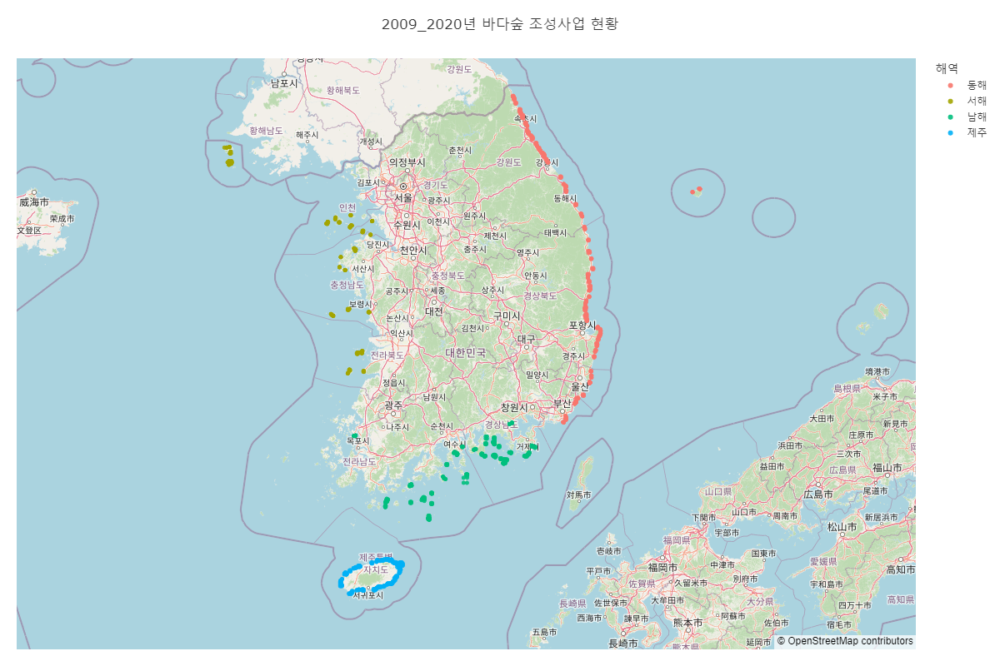

In [32]:
# 데이터 준비
workdata_df = mf1_all_df[['위도', '경도', '해역']].drop_duplicates()
# 시각화
title = '2009_2020년 바다숲 조성사업 현황'
center = {'lat': 35.8, 'lon': workdata_df['경도'].median()}
fig = px.scatter_mapbox(workdata_df, lon='경도', lat='위도', color='해역', opacity=0.9,
                        color_continuous_scale='sunsetdark', title=title, center=center, zoom=6)
fig.update_layout(mapbox_style="open-street-map", margin={"r":10,"t":70,"l":20,"b":20},
                  width=1200, height=800)
CustomUtils.display_htmls(CustomUtils.jpeg_binary_to_img_src(fig.to_image(format='png', width=1200)))

### 3.1.2 관측지점

사용하는 해양환경측정망 데이터의 관측지점 입니다.


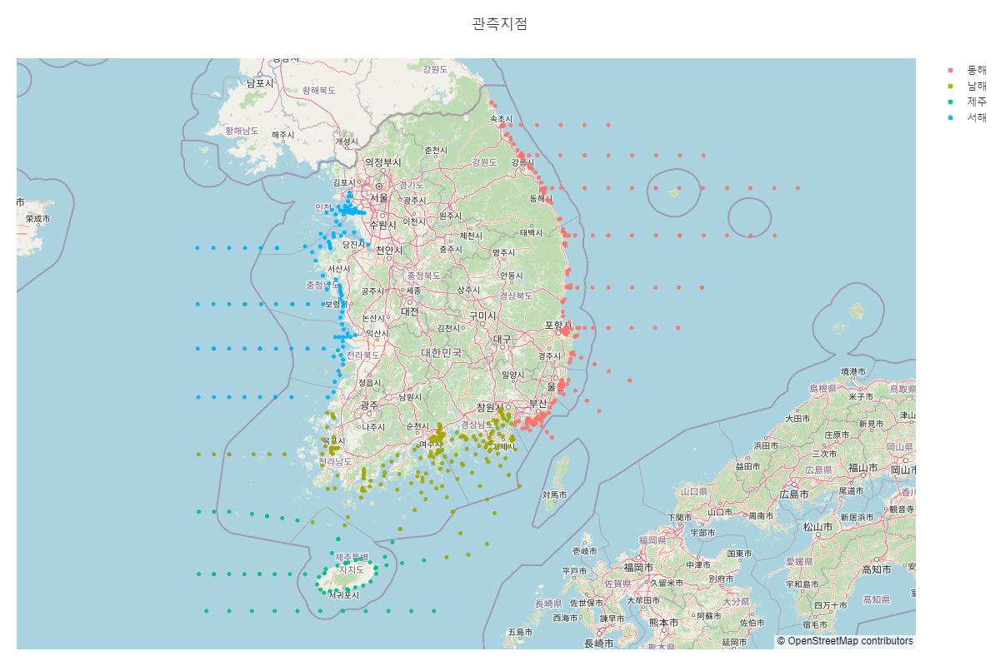

In [33]:
# 데이터 준비
workdata_df = rtu_all_df[['위도', '경도', '해역']].drop_duplicates()
# 시각화
title = '관측지점'
center = {'lat': 35.8, 'lon': workdata_df['경도'].median()}
fig = px.scatter_mapbox(workdata_df, lon='경도', lat='위도', color='해역', opacity=0.9,
                        color_continuous_scale='sunsetdark', title=title, center=center, zoom=6)
fig.update_layout(mapbox_style="open-street-map", margin={"r":10,"t":70,"l":20,"b":20},
                  width=1200, height=800, legend_title_text=None)
CustomUtils.display_htmls(CustomUtils.jpeg_binary_to_img_src(fig.to_image(format='png', width=1200)))

## 3.2 바다숲 조성 전후 비교

### 3.2.1 좌표 정밀도 조정

분석에 앞서 좌표의 정밀도를 조정하는데, 그 이유는 다음과 같습니다.

- 바다숲은 헥타르(ha) 단위로 조성되어, 인접한 관측값도 함께 살펴보려 합니다.
- 사용하는 데이터의 좌표 정밀도가 바다숲(5자리), 해양환경측정망(6자리)로 달라 일원화가 필요합니다.

정밀도 결정을 위해 해역별 좌표간 거리(km)를 확인해보겠습니다.

In [34]:
dists = []
for coord in [[37., 125.], [34., 128.], [37., 130.]]:
    result = []
    for prec in range(1, 6):
        coords = [coord, list(np.array(coord) + 10 ** (-prec))]
        result += [*coords, geodesic(*coords).km, geodesic(*coords).m]
    
    dists.append(pd.DataFrame(np.array(result, dtype='object').reshape(-1, 4), columns=['시작좌표', '종료좌표', '거리(km)', '거리(m)']))

CustomUtils.display_htmls('서해', '남해', '동해')
CustomUtils.display_htmls(*(dist.to_html() for dist in dists))

서해 남해 동해

,시작좌표,종료좌표,거리(km),거리(m)
0,"[37.0, 125.0]","[37.1, 125.1]",14.222847,14222.847178
1,"[37.0, 125.0]","[37.01, 125.01]",1.422607,1422.606689
2,"[37.0, 125.0]","[37.001, 125.001]",0.142264,142.263885
3,"[37.0, 125.0]","[37.0001, 125.0001]",0.014226,14.226421
4,"[37.0, 125.0]","[37.00001, 125.00001]",0.001423,1.422642
,시작좌표,종료좌표,거리(km),거리(m)
0,"[34.0, 128.0]","[34.1, 128.1]",14.432226,14432.225791
1,"[34.0, 128.0]","[34.01, 128.01]",1.443528,1443.528463
2,"[34.0, 128.0]","[34.001, 128.001]",0.144356,144.355902
3,"[34.0, 128.0]","[34.0001, 128.0001]",0.014436,14.435621


세 해역 모두 위도, 경도가 각각 0.0001씩 바뀔 때 마다 약 14.2 ~ 14.4m 이동하는 것을 알 수 있습니다.
헥타르(ha) 단위로 조성되는 바다숲을 감안하여, 정밀도를 0.0001로 조정하여 활용하겠습니다.

In [35]:
mf1_all_df[['위도', '경도']] = mf1_all_df[['위도', '경도']].round(4)
mf1_all_df[['위도', '경도']].head().T

,0,1,2,3,4
위도,37.8255,37.8282,37.8191,37.8220,35.8827
경도,128.8835,128.8878,128.8916,128.8956,129.5299


마찬가지로 관측데이터의 좌표 정밀도를 조정하겠습니다. 동시에 정밀도 조정으로 동일한 좌표를 갖게 되는 데이터들은 평균을 취하겠습니다.

In [36]:
rtu_all_df[['위도', '경도']] = rtu_all_df[['위도', '경도']].round(4)
rtu_all_df[['위도', '경도']].head().T

,0,1,2,3,4
위도,35.0217,35.0217,35.0217,35.0217,35.0217
경도,129.1200,129.1200,129.1200,129.1200,129.1200


### 3.2.2 바다숲 조성 전후 5년 해양 환경 변화 (모델링 전)

바다숲 조성 데이터 중, 조성 전후 5년의 관측 데이터가 있는 행만 추출합니다.

5년으로 결정한 이유는, 바다숲의 조성 이후 지방자치단체에 운영을 이관하기까지 5년이 소요되는 것을 고려하였습니다.

In [37]:
mf1_all_df[['위도_시작', '경도_시작']] = mf1_all_df.groupby(['해역', '년도', '광역시도', '면적(ha)'])[['위도', '경도']].transform('min')
mf1_all_df[['위도_종료', '경도_종료']] = mf1_all_df.groupby(['해역', '년도', '광역시도', '면적(ha)'])[['위도', '경도']].transform('max')

In [38]:
mfs_df = mf1_all_df[mf1_all_df['년도'] <= 2015].drop(columns=['위도', '경도']).drop_duplicates().reset_index(drop=True)
mfs_df

,해역,년도,광역시도,면적(ha),위도_시작,경도_시작,위도_종료,경도_종료
0,동해,2009,강원도,40.0,37.8191,128.8835,37.8282,128.8956
1,동해,2009,경상북도,35.0,35.8827,129.5299,35.8890,129.5355
2,서해,2009,충청남도,1.0,36.7219,126.1412,36.8294,126.1592
3,남해,2009,경상남도,2.0,34.7317,128.6326,34.7359,128.6460
4,남해,2009,경상남도,23.0,34.7174,128.6294,34.7235,128.6382
...,...,...,...,...,...,...,...,...
78,남해,2015,전라남도,180.0,34.4072,127.5047,34.4753,127.8225
79,제주,2015,제주도,332.3,33.5578,126.7222,33.5759,126.7784
80,제주,2015,제주도,453.1,33.3999,126.2040,33.4266,126.2389
81,제주,2015,제주도,155.6,33.2975,126.7945,33.3062,126.8227


바다숲 조성 구역에 해당하는 데이터를 찾습니다.

In [39]:
rtus_found = {}
def lookup_data(x):
    cond = (x['위도_시작'] <= rtu_all_df['위도']) & (rtu_all_df['위도'] <= x['위도_종료']) &  \
              (x['경도_시작'] <= rtu_all_df['경도']) & (rtu_all_df['경도'] <= x['경도_종료']) &  \
              (x['년도'] - 5 <= rtu_all_df['연도']) & (rtu_all_df['연도'] <= x['년도'] + 5)
    rtu_selected_df = rtu_all_df[cond].copy()
    rtu_selected_df['바다숲_id'] = str(x.name)
    rtu_selected_df['조성전후[일]'] = (rtu_selected_df['일시'] - datetime(x['년도'], 7, 1)).dt.days
    rtu_selected_df['조성전후[구분]'] = np.where(rtu_selected_df['연도'] < x['년도'], '전', np.where(rtu_selected_df['연도'] > x['년도'], '후', '기준'))
    
    if len(rtu_selected_df):
        rtus_found[x.name] = rtu_selected_df
    
mfs_df.apply(lookup_data, axis=1)
print(f'관측 데이터가 있는 바다숲으로 {len(rtus_found)}개의 구역을 찾았습니다.')

관측 데이터가 있는 바다숲으로 7개의 구역을 찾았습니다.


#### 3.2.2.1 전처리

In [40]:
rtu_found_df = pd.concat(rtus_found.values())
rtu_found_df

,일시,경도,위도,수심(m),염분[psu],수온[℃],용존산소[mg/L],규산염[μM],아질산성질소[μM],인산염인[μM],...,연도,월,연월,경과_분,분기,연분기,계절,바다숲_id,조성전후[일],조성전후[구분]
51511,2009-02-01 00:00:00,127.6611,34.7325,9.0,33.4000,7.3700,8.24000,NaN,NaN,NaN,...,2009,2,200902,2634510.0,1,20091,겨울,11,-515,전
54783,2009-05-01 00:00:00,127.6611,34.7325,8.0,33.7300,19.2500,7.12000,NaN,NaN,NaN,...,2009,5,200905,2762670.0,2,20092,봄,11,-426,전
56700,2009-08-01 00:00:00,127.6611,34.7325,0.0,30.9000,23.2500,8.38000,NaN,NaN,NaN,...,2009,8,200908,2895150.0,3,20093,여름,11,-334,전
61800,2010-02-01 00:00:00,127.6611,34.7325,0.0,32.8600,6.0200,10.85000,NaN,NaN,NaN,...,2010,2,201002,3160110.0,1,20101,겨울,11,-150,기준
61801,2010-02-01 00:00:00,127.6611,34.7325,9.0,32.8600,3.8500,10.72000,NaN,NaN,NaN,...,2010,2,201002,3160110.0,1,20101,겨울,11,-150,기준
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171487,2020-05-18 10:50:00,126.7328,33.5739,43.0,33.9643,15.9638,8.08717,NaN,NaN,NaN,...,2020,5,202005,8573720.0,2,20202,봄,79,1783,후
173961,2020-08-19 12:08:00,126.7328,33.5739,0.0,31.8180,27.0498,7.16379,NaN,NaN,NaN,...,2020,8,202008,8707718.0,3,20203,여름,79,1876,후
173962,2020-08-19 12:08:00,126.7328,33.5739,42.0,33.9719,17.5395,5.97774,NaN,NaN,NaN,...,2020,8,202008,8707718.0,3,20203,여름,79,1876,후
176878,2020-11-09 13:52:00,126.7328,33.5739,0.0,32.2571,18.2779,8.50781,NaN,NaN,NaN,...,2020,11,202011,8825902.0,4,20204,가을,79,1958,후


결측치가 많으면 활용이 어려우므로, 결측치를 다음의 절차로 제거합니다.

1) 결측치의 빈도가 20% 이하인 열만 남깁니다.
2) 결측치가 있는 행을 제외합니다.

In [41]:
CustomUtils.display_htmls(rtu_found_df.isna().sum().sort_values().to_frame().T.to_html())

,일시,바다숲_id,계절,연분기,분기,경과_분,연월,월,연도,해역,조성전후[일],조성전후[구분],경도,위도,수심(m),수온[℃],염분[psu],용존산소[mg/L],수소이온농도[무단위],총인[μg/L],암모니아성 질소[μg/L],화학적산소요구량[mg/L],아질산성질소[μg/L],질산성질소[μg/L],인산염인[μg/L],규산염[μg/L],용존무기질소[μg/L],클로로필-a[μg/L],총질소[μg/L],부유물질 농도[μg/L],투명도[m],전체수심(m),부유물질 농도[mg/L],질산성질소[μM],인산염인[μM],아질산성질소[μM],규산염[μM],용존산소[ml/L],유분[mg/L]
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,5,176,196,196,196,196,196,196,196,196,196,207,212,354,567,1091,1109,1125,1125,1125,1125,1125,1125


In [42]:
valid_cols = rtu_found_df.columns[rtu_found_df.isna().sum().div(rtu_found_df.shape[0]).le(0.2)]
rtu_found_df = rtu_found_df[valid_cols]
rtu_found_df

,일시,경도,위도,수심(m),염분[psu],수온[℃],용존산소[mg/L],수소이온농도[무단위],총질소[μg/L],클로로필-a[μg/L],...,연도,월,연월,경과_분,분기,연분기,계절,바다숲_id,조성전후[일],조성전후[구분]
51511,2009-02-01 00:00:00,127.6611,34.7325,9.0,33.4000,7.3700,8.24000,7.98,700.8,1.8900,...,2009,2,200902,2634510.0,1,20091,겨울,11,-515,전
54783,2009-05-01 00:00:00,127.6611,34.7325,8.0,33.7300,19.2500,7.12000,7.97,522.0,1.6600,...,2009,5,200905,2762670.0,2,20092,봄,11,-426,전
56700,2009-08-01 00:00:00,127.6611,34.7325,0.0,30.9000,23.2500,8.38000,8.12,346.0,1.5900,...,2009,8,200908,2895150.0,3,20093,여름,11,-334,전
61800,2010-02-01 00:00:00,127.6611,34.7325,0.0,32.8600,6.0200,10.85000,8.08,114.0,2.5200,...,2010,2,201002,3160110.0,1,20101,겨울,11,-150,기준
61801,2010-02-01 00:00:00,127.6611,34.7325,9.0,32.8600,3.8500,10.72000,8.09,98.0,1.5600,...,2010,2,201002,3160110.0,1,20101,겨울,11,-150,기준
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171487,2020-05-18 10:50:00,126.7328,33.5739,43.0,33.9643,15.9638,8.08717,8.35,NaN,0.4600,...,2020,5,202005,8573720.0,2,20202,봄,79,1783,후
173961,2020-08-19 12:08:00,126.7328,33.5739,0.0,31.8180,27.0498,7.16379,8.45,NaN,0.2580,...,2020,8,202008,8707718.0,3,20203,여름,79,1876,후
173962,2020-08-19 12:08:00,126.7328,33.5739,42.0,33.9719,17.5395,5.97774,8.30,NaN,0.1092,...,2020,8,202008,8707718.0,3,20203,여름,79,1876,후
176878,2020-11-09 13:52:00,126.7328,33.5739,0.0,32.2571,18.2779,8.50781,8.37,NaN,2.9600,...,2020,11,202011,8825902.0,4,20204,가을,79,1958,후


남은 결측값은 행 단위로 제외하겠습니다.

In [43]:
rtu_found_df = rtu_found_df.dropna(axis=0, how='any')
rtu_found_df

,일시,경도,위도,수심(m),염분[psu],수온[℃],용존산소[mg/L],수소이온농도[무단위],총질소[μg/L],클로로필-a[μg/L],...,연도,월,연월,경과_분,분기,연분기,계절,바다숲_id,조성전후[일],조성전후[구분]
51511,2009-02-01 00:00:00,127.6611,34.7325,9.0,33.40,7.37,8.24,7.98,700.8,1.89,...,2009,2,200902,2634510.0,1,20091,겨울,11,-515,전
54783,2009-05-01 00:00:00,127.6611,34.7325,8.0,33.73,19.25,7.12,7.97,522.0,1.66,...,2009,5,200905,2762670.0,2,20092,봄,11,-426,전
56700,2009-08-01 00:00:00,127.6611,34.7325,0.0,30.90,23.25,8.38,8.12,346.0,1.59,...,2009,8,200908,2895150.0,3,20093,여름,11,-334,전
61800,2010-02-01 00:00:00,127.6611,34.7325,0.0,32.86,6.02,10.85,8.08,114.0,2.52,...,2010,2,201002,3160110.0,1,20101,겨울,11,-150,기준
61801,2010-02-01 00:00:00,127.6611,34.7325,9.0,32.86,3.85,10.72,8.09,98.0,1.56,...,2010,2,201002,3160110.0,1,20101,겨울,11,-150,기준
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158468,2019-02-27 00:00:00,126.7328,33.5739,45.0,34.36,14.99,9.26,8.22,72.4,0.33,...,2019,2,201902,7930830.0,1,20191,겨울,79,1337,후
160472,2019-05-08 00:00:00,126.7328,33.5739,0.0,34.33,16.79,10.81,8.26,141.3,0.12,...,2019,5,201905,8031630.0,2,20192,봄,79,1407,후
163589,2019-08-13 11:58:00,126.7328,33.5739,0.0,31.14,27.22,7.12,8.21,143.3,0.18,...,2019,8,201908,8172028.0,3,20193,여름,79,1504,후
165558,2019-11-05 14:25:00,126.7328,33.5739,0.0,33.29,20.85,7.65,8.18,448.7,1.73,...,2019,11,201911,8293135.0,4,20194,가을,79,1588,후


결측치 처리가 완료되었는지 확인해보겠습니다.

In [44]:
CustomUtils.display_htmls(rtu_found_df.isna().sum().to_frame().T.to_html())

,일시,경도,위도,수심(m),염분[psu],수온[℃],용존산소[mg/L],수소이온농도[무단위],총질소[μg/L],클로로필-a[μg/L],규산염[μg/L],아질산성질소[μg/L],인산염인[μg/L],질산성질소[μg/L],용존무기질소[μg/L],화학적산소요구량[mg/L],암모니아성 질소[μg/L],총인[μg/L],해역,연도,월,연월,경과_분,분기,연분기,계절,바다숲_id,조성전후[일],조성전후[구분]
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


#### 3.2.2.2 관측 변수 별 분석

##### 3.2.2.2.1 염분

바다숲 조성 전후 표층의 염분 변화를 보겠습니다.

In [45]:
col = '염분[psu]'
cond = (rtu_found_df['수심(m)'] == 0.0)
workdata_df = rtu_found_df[cond]
workdata_df

,일시,경도,위도,수심(m),염분[psu],수온[℃],용존산소[mg/L],수소이온농도[무단위],총질소[μg/L],클로로필-a[μg/L],...,연도,월,연월,경과_분,분기,연분기,계절,바다숲_id,조성전후[일],조성전후[구분]
56700,2009-08-01 00:00:00,127.6611,34.7325,0.0,30.9000,23.2500,8.38000,8.120,346.000,1.590,...,2009,8,200908,2895150.0,3,20093,여름,11,-334,전
61800,2010-02-01 00:00:00,127.6611,34.7325,0.0,32.8600,6.0200,10.85000,8.080,114.000,2.520,...,2010,2,201002,3160110.0,1,20101,겨울,11,-150,기준
65041,2010-05-01 00:00:00,127.6611,34.7325,0.0,33.1500,17.4100,9.38000,8.200,100.000,2.280,...,2010,5,201005,3288270.0,2,20102,봄,11,-61,기준
66720,2010-08-01 00:00:00,127.6611,34.7325,0.0,31.1000,29.2200,7.56000,8.160,76.000,1.920,...,2010,8,201008,3420750.0,3,20103,여름,11,31,기준
75152,2011-05-19 00:00:00,127.6611,34.7325,0.0,33.3575,20.2705,6.76855,8.113,252.476,5.336,...,2011,5,201105,3839790.0,2,20112,봄,11,322,후
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155222,2018-11-15 12:15:00,126.7328,33.5739,0.0,33.2900,18.7400,8.41000,7.760,131.400,0.310,...,2018,11,201811,7781805.0,4,20184,가을,79,1233,후
158467,2019-02-27 00:00:00,126.7328,33.5739,0.0,34.3600,15.0000,9.47000,8.220,110.300,0.350,...,2019,2,201902,7930830.0,1,20191,겨울,79,1337,후
160472,2019-05-08 00:00:00,126.7328,33.5739,0.0,34.3300,16.7900,10.81000,8.260,141.300,0.120,...,2019,5,201905,8031630.0,2,20192,봄,79,1407,후
163589,2019-08-13 11:58:00,126.7328,33.5739,0.0,31.1400,27.2200,7.12000,8.210,143.300,0.180,...,2019,8,201908,8172028.0,3,20193,여름,79,1504,후



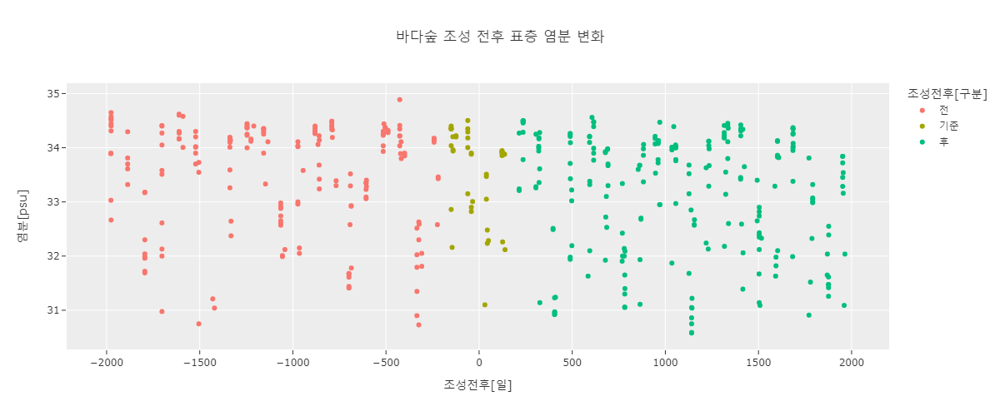

In [46]:
title = f'바다숲 조성 전후 표층 {col.split("[")[0]} 변화'
fig = px.scatter(workdata_df, x='조성전후[일]', y=col, color='조성전후[구분]', title=title)
CustomUtils.display_htmls(CustomUtils.jpeg_binary_to_img_src(fig.to_image(format='png', width=1200)))

In [47]:
bca_sr = workdata_df.groupby('조성전후[구분]')[col].mean().reindex(['전', '기준', '후'])
CustomUtils.display_htmls('', bca_sr.to_frame().reset_index().T.to_html(), '')
CustomUtils.display_htmls(f"{col} 변동 : {round((bca_sr['후'] - bca_sr['전']) / bca_sr['전'] * 100, 3)}%")

,0,1,2
조성전후[구분],전,기준,후
염분[psu],33.487202,33.554745,33.136272


염분[psu] 변동 : -1.048%

바다숲 조성 후, 조성 전에 비해 염분이 약 1.05% 감소하는 것을 발견하였습니다.

다음으로 수중의 염분 변화를 살펴보겠습니다.


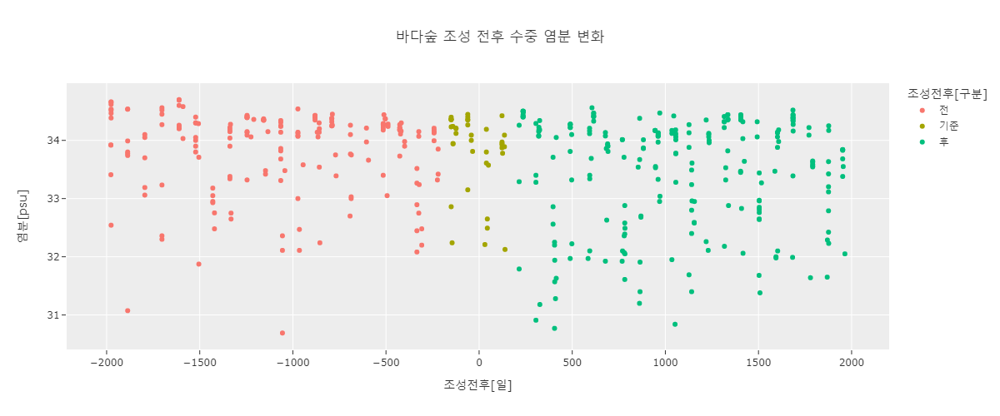

In [48]:
col = '염분[psu]'
cond = (rtu_found_df['수심(m)'] > 0.0)
workdata_df = rtu_found_df[cond]
title = f'바다숲 조성 전후 수중 {col.split("[")[0]} 변화'
fig = px.scatter(workdata_df, x='조성전후[일]', y=col, color='조성전후[구분]', title=title)
CustomUtils.display_htmls(CustomUtils.jpeg_binary_to_img_src(fig.to_image(format='png', width=1200)))

In [49]:
bca_sr = workdata_df.groupby('조성전후[구분]')[col].mean().reindex(['전', '기준', '후'])
CustomUtils.display_htmls('', bca_sr.to_frame().reset_index().T.to_html(), '')
CustomUtils.display_htmls(f"{col} 변동 : {round((bca_sr['후'] - bca_sr['전']) / bca_sr['전'] * 100, 3)}%")

,0,1,2
조성전후[구분],전,기준,후
염분[psu],33.830615,33.8267,33.444925


염분[psu] 변동 : -1.14%

바다숲 조성 후, 조성 전에 비해 염분이 약 1.14% 감소 한 것을 발견하였습니다.

같은 방법으로 나머지 관측 항목들을 모두 살펴보겠습니다.

수온[℃]


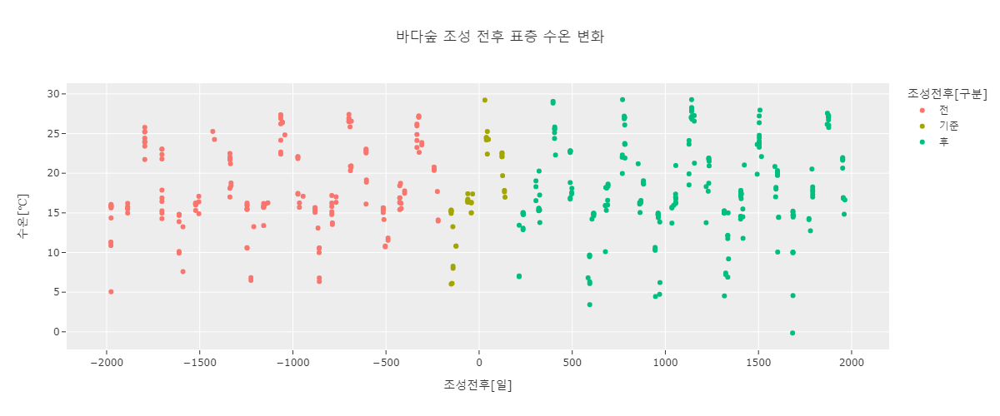

,0,1,2
조성전후[구분],전,기준,후
수온[℃],17.997874,17.311487,17.851043


수온[℃] 변동 : -0.816%


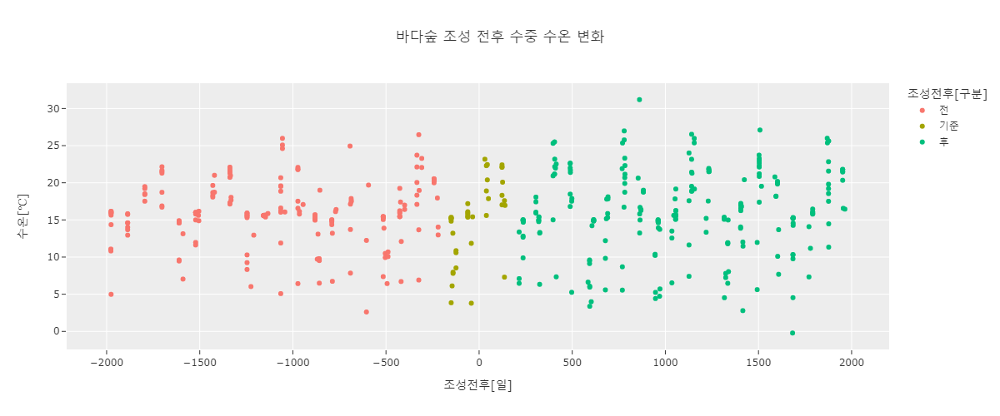

,0,1,2
조성전후[구분],전,기준,후
수온[℃],15.737668,15.164797,15.92851


수온[℃] 변동 : 1.213%

용존산소[mg/L]


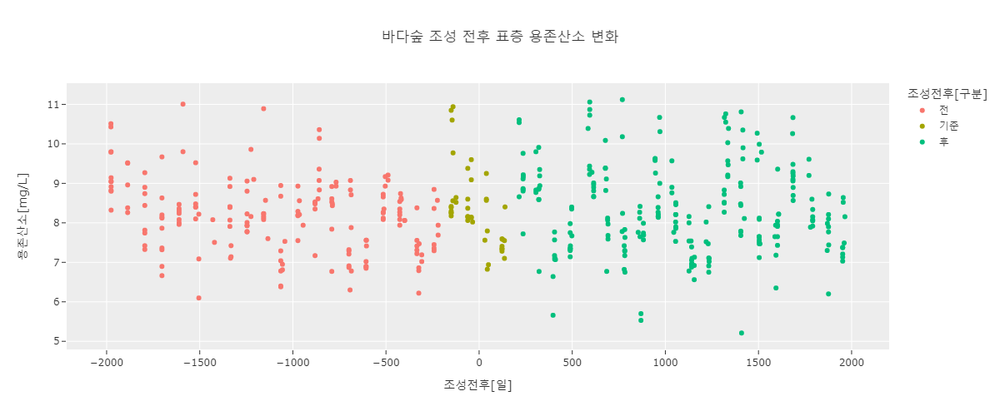

,0,1,2
조성전후[구분],전,기준,후
용존산소[mg/L],8.190357,8.362547,8.330859


용존산소[mg/L] 변동 : 1.715%


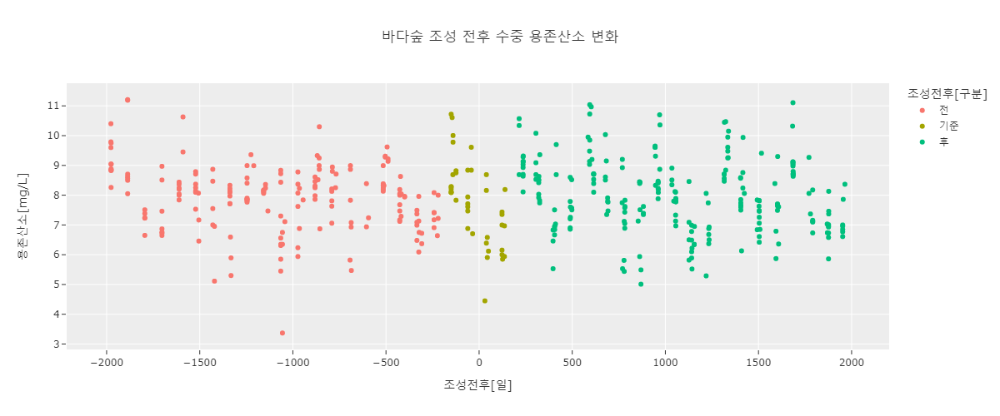

,0,1,2
조성전후[구분],전,기준,후
용존산소[mg/L],7.919016,7.770649,7.976586


용존산소[mg/L] 변동 : 0.727%

수소이온농도[무단위]


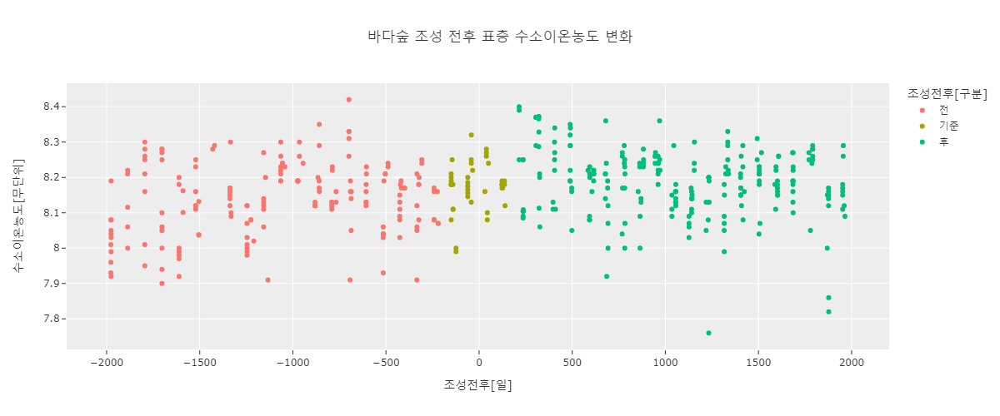

,0,1,2
조성전후[구분],전,기준,후
수소이온농도[무단위],8.136366,8.174966,8.185174


수소이온농도[무단위] 변동 : 0.6%


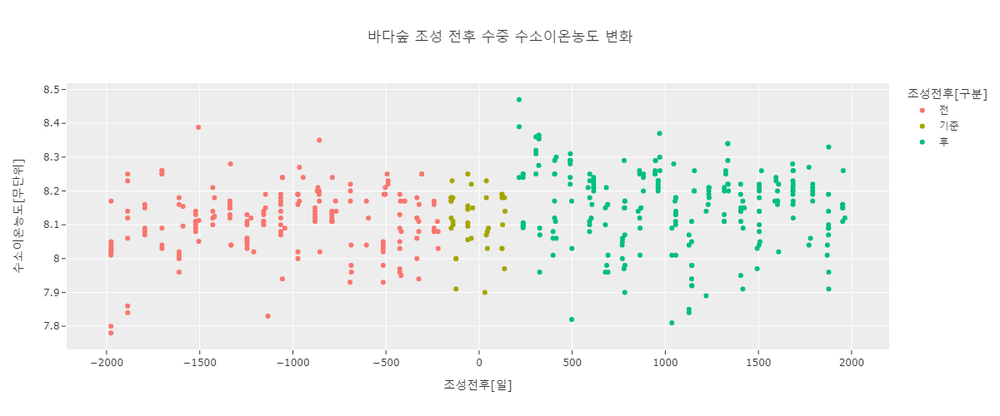

,0,1,2
조성전후[구분],전,기준,후
수소이온농도[무단위],8.108283,8.114068,8.155681


수소이온농도[무단위] 변동 : 0.585%

총질소[μg/L]


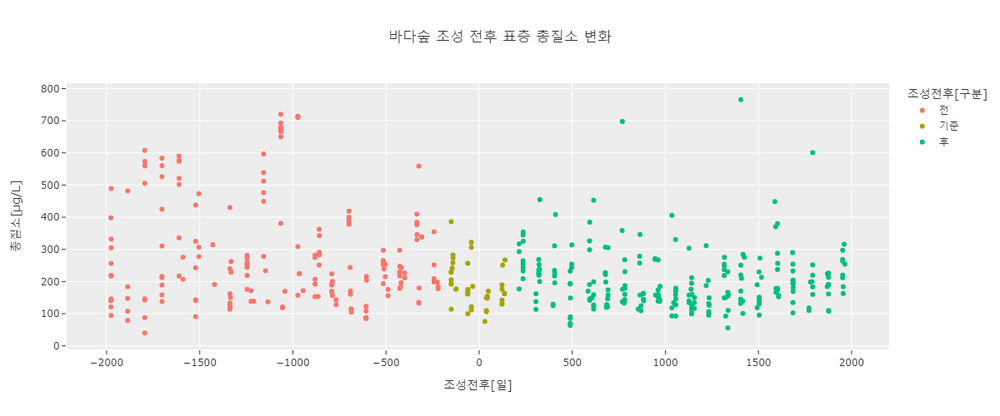

,0,1,2
조성전후[구분],전,기준,후
총질소[μg/L],281.339661,188.88905,202.179576


총질소[μg/L] 변동 : -28.137%


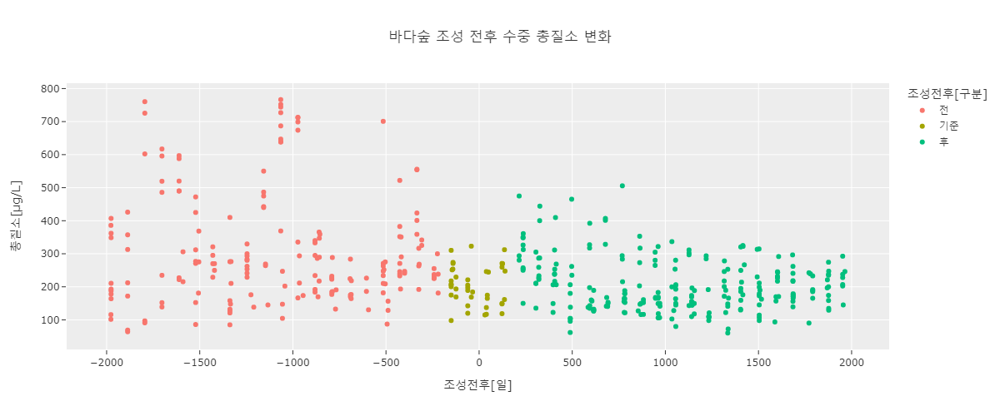

,0,1,2
조성전후[구분],전,기준,후
총질소[μg/L],307.356396,203.731231,206.657463


총질소[μg/L] 변동 : -32.763%

클로로필-a[μg/L]


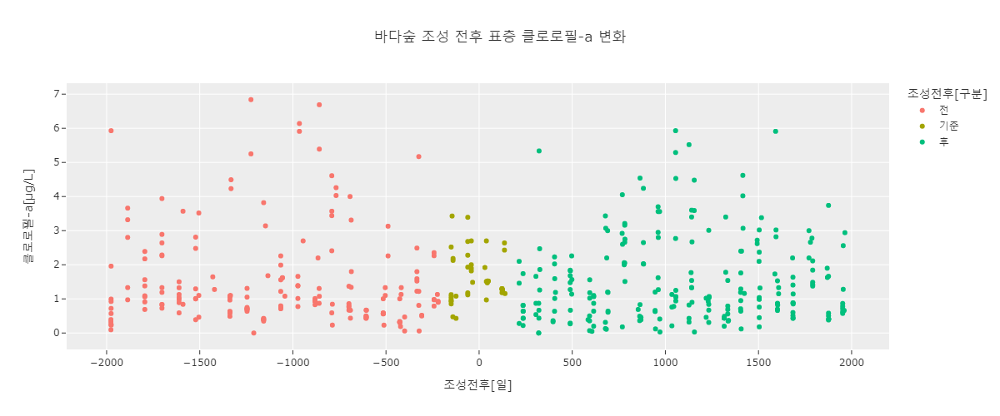

,0,1,2
조성전후[구분],전,기준,후
클로로필-a[μg/L],1.518781,1.652384,1.502172


클로로필-a[μg/L] 변동 : -1.094%


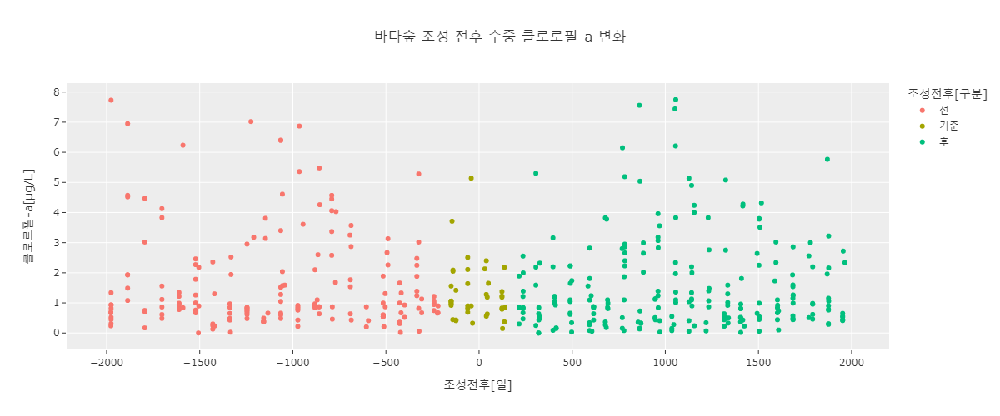

,0,1,2
조성전후[구분],전,기준,후
클로로필-a[μg/L],1.620749,1.333279,1.522891


클로로필-a[μg/L] 변동 : -6.038%

규산염[μg/L]


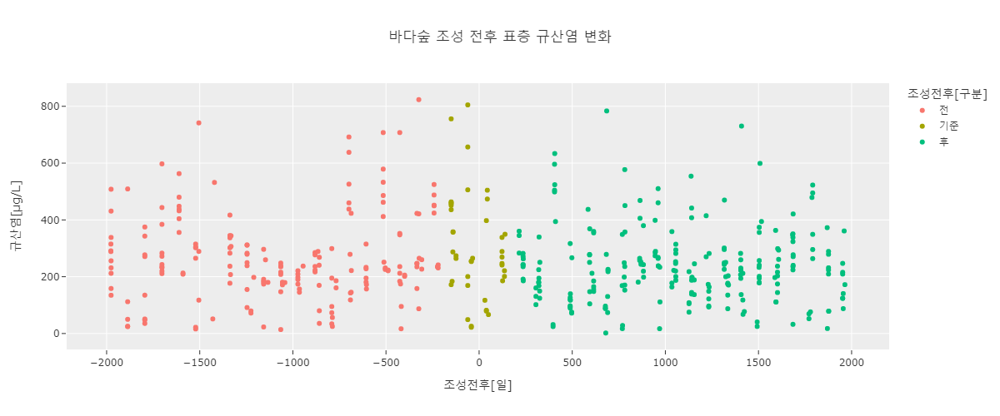

,0,1,2
조성전후[구분],전,기준,후
규산염[μg/L],264.634524,304.72915,237.218987


규산염[μg/L] 변동 : -10.36%


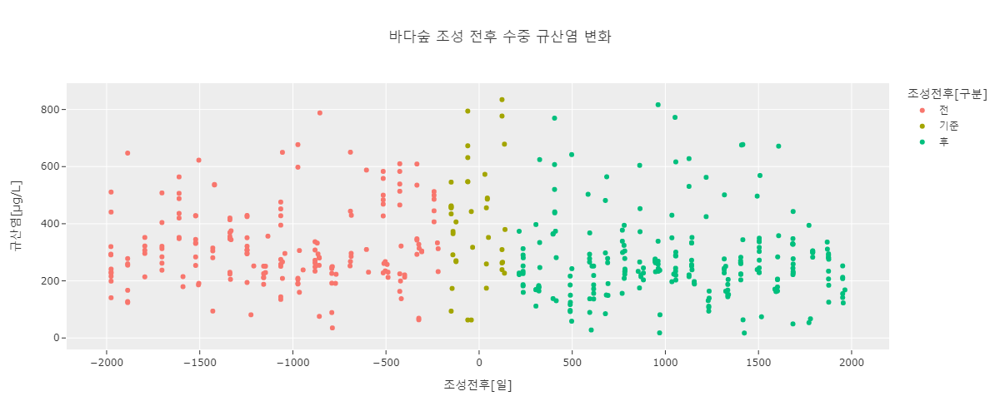

,0,1,2
조성전후[구분],전,기준,후
규산염[μg/L],320.399267,407.730974,268.901686


규산염[μg/L] 변동 : -16.073%

아질산성질소[μg/L]


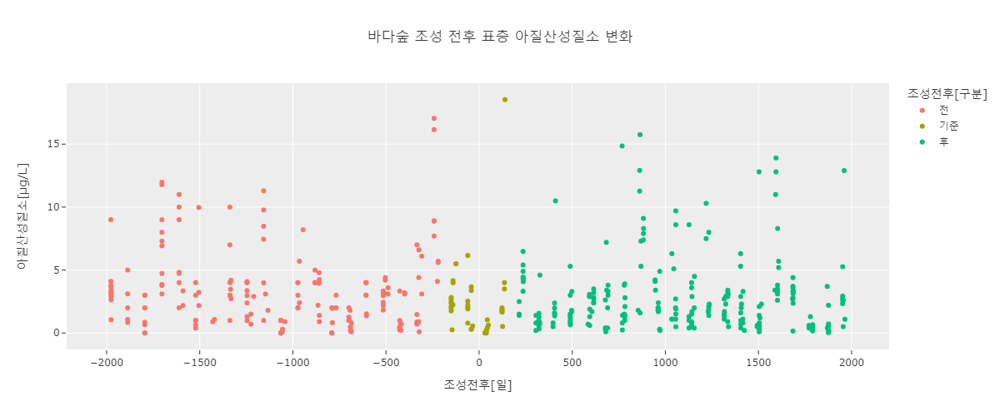

,0,1,2
조성전후[구분],전,기준,후
아질산성질소[μg/L],3.32135,2.493071,2.89898


아질산성질소[μg/L] 변동 : -12.717%


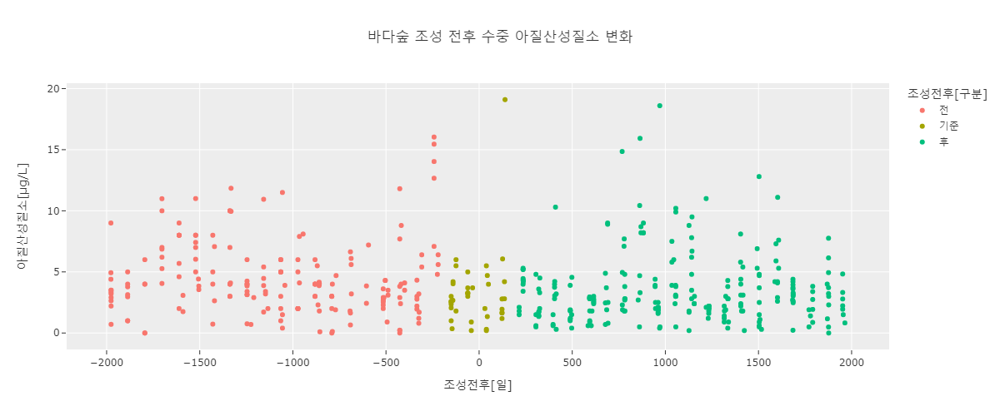

,0,1,2
조성전후[구분],전,기준,후
아질산성질소[μg/L],4.443215,3.237861,3.532342


아질산성질소[μg/L] 변동 : -20.5%

인산염인[μg/L]


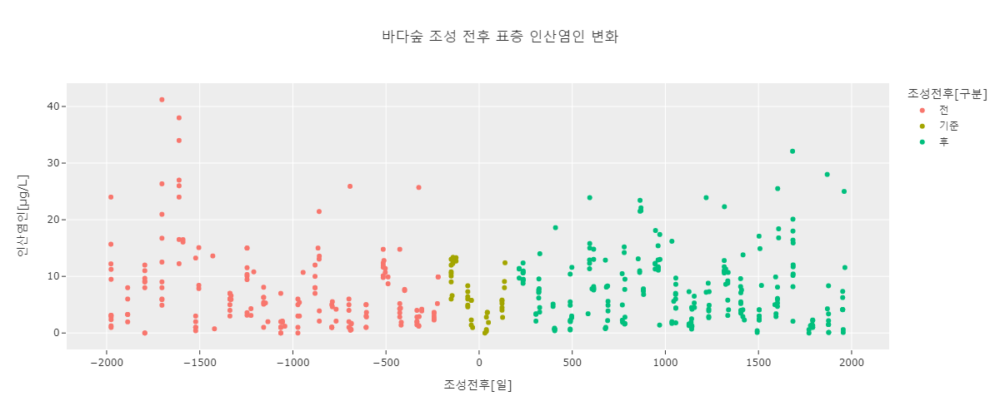

,0,1,2
조성전후[구분],전,기준,후
인산염인[μg/L],7.348461,6.659505,7.574194


인산염인[μg/L] 변동 : 3.072%


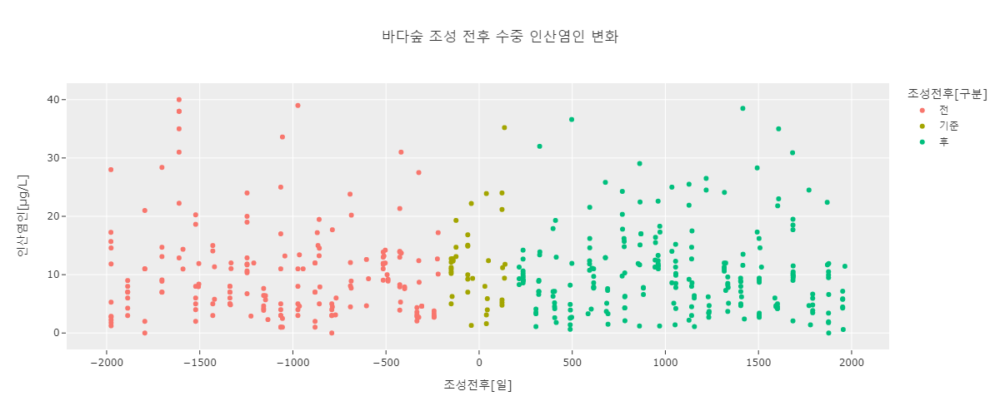

,0,1,2
조성전후[구분],전,기준,후
인산염인[μg/L],10.259385,11.712778,10.181867


인산염인[μg/L] 변동 : -0.756%

질산성질소[μg/L]


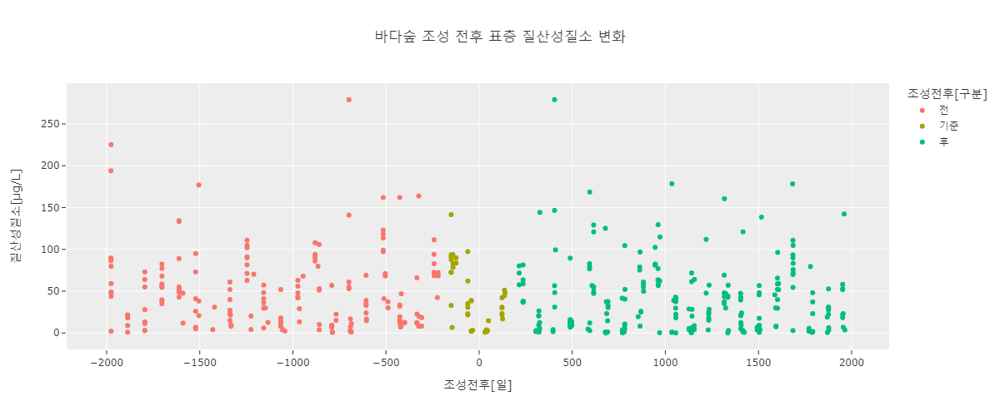

,0,1,2
조성전후[구분],전,기준,후
질산성질소[μg/L],49.420908,42.966662,41.34011


질산성질소[μg/L] 변동 : -16.351%


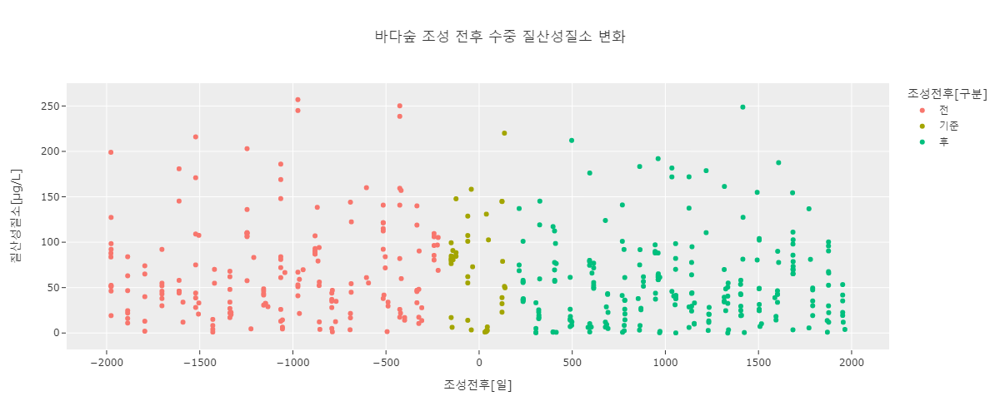

,0,1,2
조성전후[구분],전,기준,후
질산성질소[μg/L],67.946441,72.757828,54.195828


질산성질소[μg/L] 변동 : -20.237%

용존무기질소[μg/L]


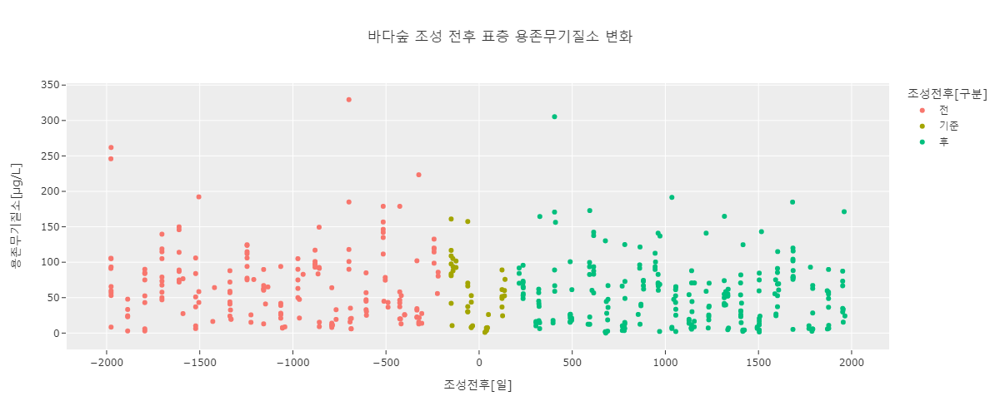

,0,1,2
조성전후[구분],전,기준,후
용존무기질소[μg/L],67.536435,56.366265,54.22623


용존무기질소[μg/L] 변동 : -19.708%


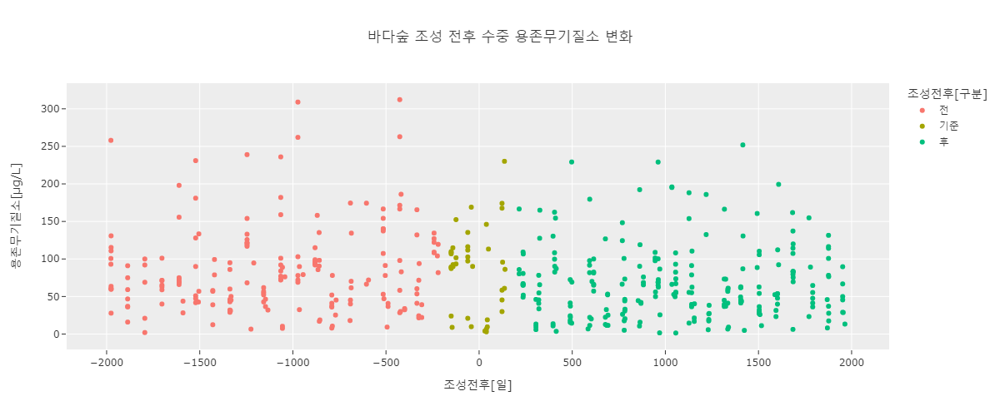

,0,1,2
조성전후[구분],전,기준,후
용존무기질소[μg/L],85.492529,86.457703,67.871804


용존무기질소[μg/L] 변동 : -20.611%

화학적산소요구량[mg/L]


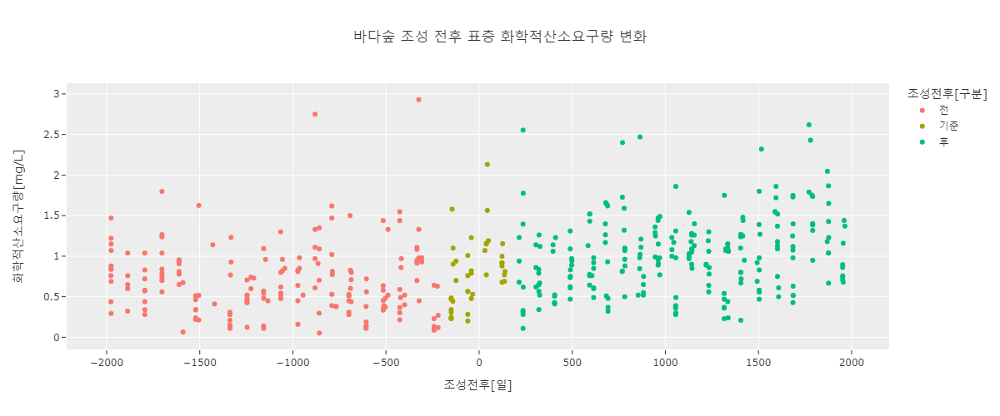

,0,1,2
조성전후[구분],전,기준,후
화학적산소요구량[mg/L],0.689338,0.801594,1.021371


화학적산소요구량[mg/L] 변동 : 48.167%


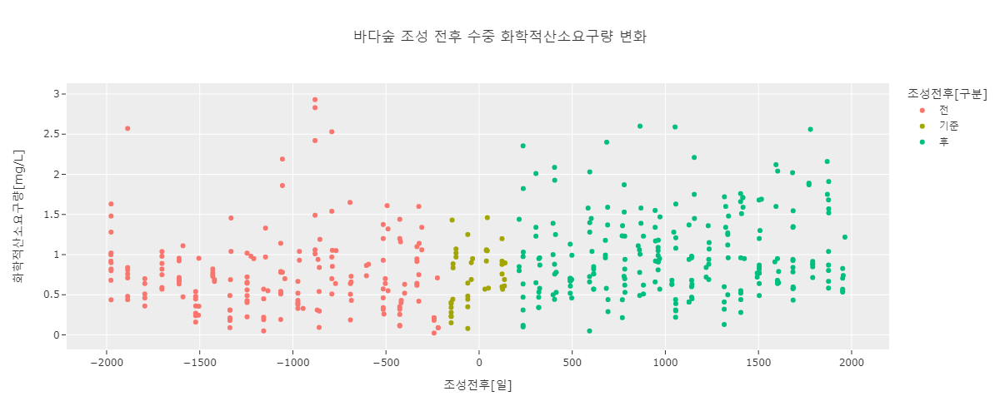

,0,1,2
조성전후[구분],전,기준,후
화학적산소요구량[mg/L],0.748726,0.725349,0.999442


화학적산소요구량[mg/L] 변동 : 33.486%

암모니아성 질소[μg/L]


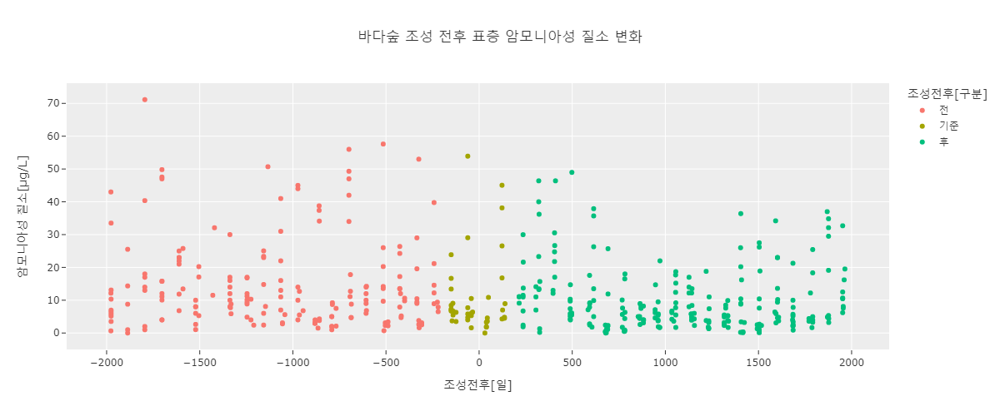

,0,1,2
조성전후[구분],전,기준,후
암모니아성 질소[μg/L],14.795285,10.879061,9.991844


암모니아성 질소[μg/L] 변동 : -32.466%


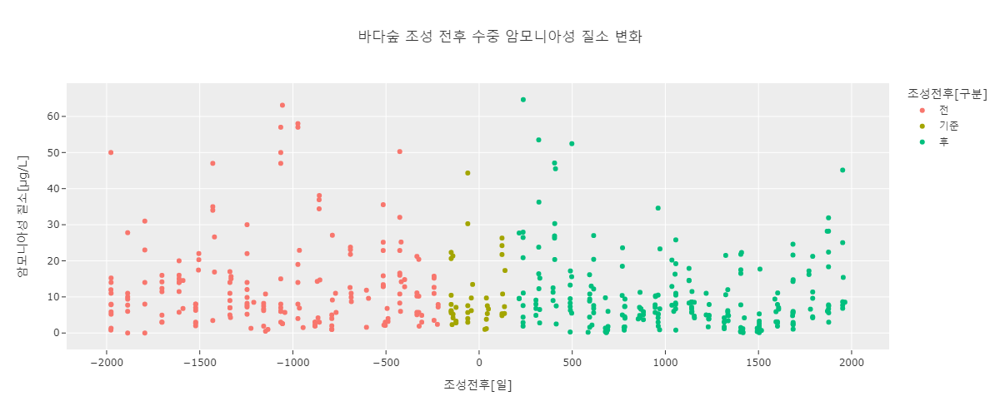

,0,1,2
조성전후[구분],전,기준,후
암모니아성 질소[μg/L],13.096266,10.46199,10.151273


암모니아성 질소[μg/L] 변동 : -22.487%

총인[μg/L]


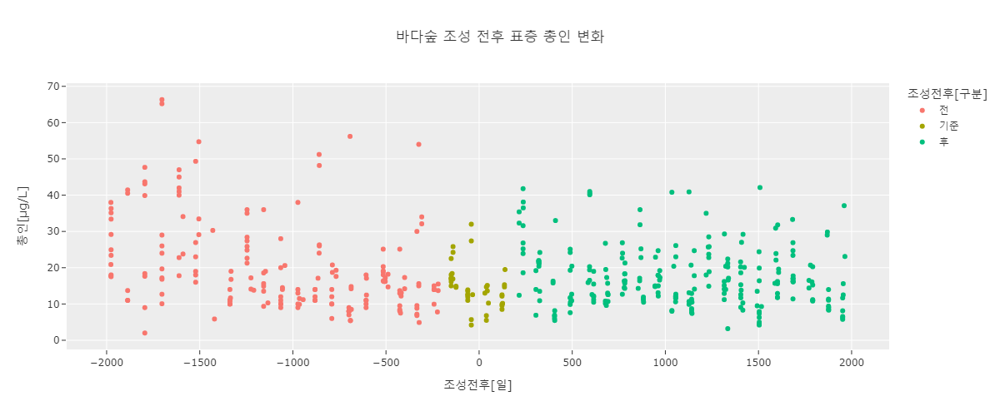

,0,1,2
조성전후[구분],전,기준,후
총인[μg/L],20.079324,14.65573,17.441198


총인[μg/L] 변동 : -13.139%


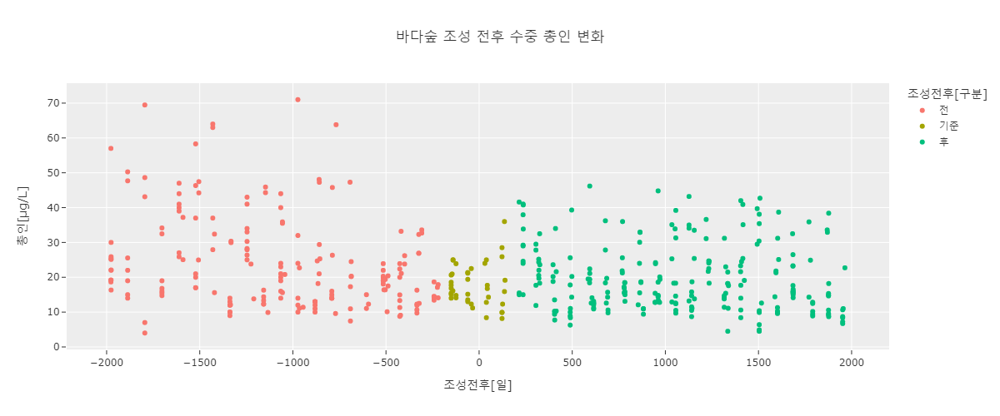

,0,1,2
조성전후[구분],전,기준,후
총인[μg/L],24.124014,17.754418,19.665609


총인[μg/L] 변동 : -18.481%

In [50]:
for col in rtu_found_df.columns[5:-11]:
    CustomUtils.display_htmls('', f'<h2>{col}</h2>', '')
    # 표층
    cond = (rtu_found_df['수심(m)'] == 0.0)
    workdata_df = rtu_found_df[cond]
    title = f'바다숲 조성 전후 표층 {col.split("[")[0]} 변화'
    fig = px.scatter(workdata_df, x='조성전후[일]', y=col, color='조성전후[구분]', title=title)
    CustomUtils.display_htmls(CustomUtils.jpeg_binary_to_img_src(fig.to_image(format='png', width=1200)))
    bca_sr = workdata_df.groupby('조성전후[구분]')[col].mean().reindex(['전', '기준', '후'])
    CustomUtils.display_htmls('', bca_sr.to_frame().reset_index().T.to_html(), '')
    CustomUtils.display_htmls(f"{col} 변동 : {round((bca_sr['후'] - bca_sr['전']) / bca_sr['전'] * 100, 3)}%")
    
    # 수중
    cond = (rtu_found_df['수심(m)'] > 0.0)
    workdata_df = rtu_found_df[cond]
    title = f'바다숲 조성 전후 수중 {col.split("[")[0]} 변화'
    fig = px.scatter(workdata_df, x='조성전후[일]', y=col, color='조성전후[구분]', title=title)
    CustomUtils.display_htmls(CustomUtils.jpeg_binary_to_img_src(fig.to_image(format='png', width=1200)))
    bca_sr = workdata_df.groupby('조성전후[구분]')[col].mean().reindex(['전', '기준', '후'])
    CustomUtils.display_htmls('', bca_sr.to_frame().reset_index().T.to_html(), '')
    CustomUtils.display_htmls(f"{col} 변동 : {round((bca_sr['후'] - bca_sr['전']) / bca_sr['전'] * 100, 3)}%")
    print()


이상의 분석 중, 5% 이상 변동을 보인 항목들은 다음과 같습니다.

- 총질소: 바다숲 조성 후 표층에서 28.14%, 수중에서 32.76% 감소하였습니다.
- 클로로필-a : 바다숲 조성 후 수중에서 6.04% 감소하였습니다.
- 규산염 : 바다숲 조성 후 표층에서 10.4%, 수중에서 16.07% 감소하였습니다.
- 아질산성질소 : 바다숲 조성 후 표층에서 12.72%, 수중에서 20.5% 감소하였습니다.
- 질산성질소 : 바다숲 조성 후 표층에서 16.35%, 수중에서 20.24% 감소하였습니다.
- 용존무기질소 : 바다숲 조성 후 표층에서 19.71%, 수중에서 20.61% 감소하였습니다.
- 암모니아성질소 : 바다숲 조성 후 표층에서 32.47%, 수중에서 22.49% 감소하였습니다.
- 화학적산소요구량(COD) : 바다숲 조성 후 표층에서 48.17%, 수중에서 33.49% 증가하였습니다.
- 암모니아성 질소 : 바다숲 조성 후 표층에서 32.47%, 수중에서 22.49% 감소하였습니다.
- 총인 : 바다숲 조성 후 표층에서 13.14%, 수중에서 18.48% 감소하였습니다.

이 중 변화폭이 큰 항목은 총 질소와 화학적 산소 요구량(COD)으로, 차후 변화 원인을 파악하는 것이 필요하다는 결론을 얻었습니다.

### 3.2.3 모델링

지금까지 바다숲 조성 전후 해양 데이터의 변화를 살펴봤습니다.

여러 관측 변수들의 변동을 살펴보았으나,  결측치 제거 등으로 활용 데이터가 부족하였다고 판단하였습니다.

이에 다양한 방법의 모델링을 수행하여, 과거 기간의 결측치를 예측한 뒤 다시 분석을 하기로 하였습니다.

모델링으로는 LightGBM이 활용되었습니다.

대상 변수를 선정하기 위해 열 별 결측치를 확인해보겠습니다.

In [51]:
nan_cols_df = rtu_all_df.isna().sum().rename_axis('열 이름').to_frame('결측 빈도')
fig = px.bar(nan_cols_df, y='결측 빈도')
CustomUtils.display_htmls(fig.to_html(), nan_cols_df.T.to_html(), orientation='v')

결측값이 적은 순서로 "수온[℃]"과 "염분[psu]"을 각각 살펴보겠습니다.

#### 3.2.3.1 "수온[℃]" 예측 모델링

먼저 결측값이 191건으로 가장 적은 '수온[℃]'을 예측하는 모델을 생성 해보겠습니다.

In [52]:
cond = (rtu_all_df['수온[℃]'].isna())
rtu_all_df[cond]

,일시,경도,위도,수심(m),염분[psu],수온[℃],용존산소[mg/L],규산염[μM],아질산성질소[μM],인산염인[μM],...,총인[μg/L],부유물질 농도[mg/L],해역,연도,월,연월,경과_분,분기,연분기,계절
49,2004-01-29 19:55:00,128.2033,34.5167,42.0,NaN,NaN,NaN,16.63,0.29,0.51,...,NaN,NaN,남해,2004,1,200401,505.0,1,20041,겨울
157,2004-01-30 14:35:00,127.0533,33.5967,88.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,제주,2004,1,200401,1625.0,1,20041,겨울
181,2004-01-30 17:40:00,127.5667,33.5600,95.0,NaN,NaN,NaN,7.74,0.15,0.38,...,NaN,NaN,제주,2004,1,200401,1810.0,1,20041,겨울
197,2004-01-30 22:25:00,127.7000,33.0000,145.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,제주,2004,1,200401,2095.0,1,20041,겨울
866,2004-02-08 22:00:00,125.3000,33.0000,80.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,제주,2004,2,200402,15030.0,1,20041,겨울
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172735,2020-06-16 09:05:00,126.5000,33.0000,125.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,제주,2020,6,202006,8615375.0,2,20202,여름
173719,2020-08-17 12:30:00,126.5000,33.0000,125.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,제주,2020,8,202008,8704860.0,3,20203,여름
175611,2020-10-19 21:20:00,128.5750,34.5917,75.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,남해,2020,10,202010,8796110.0,4,20204,가을
176138,2020-10-26 10:55:00,126.5000,33.0000,125.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,제주,2020,10,202010,8805565.0,4,20204,가을


머신러닝에서 빠르면서 성능도 좋은 것으로 알려진 LightGBM을 사용해보겠습니다.

대상 변수가 결정되었으므로 이제 X_cols를 탐색하겠습니다.
대상 변수를 제외한 열들의 결측치 빈도를 조회합니다.

In [53]:
rtu_all_df.drop('수온[℃]', axis=1).isna().sum().sort_values().to_frame().head(20).T

,일시,분기,경과_분,연월,월,연도,해역,연분기,계절,경도,위도,수심(m),염분[psu],용존산소[mg/L],투명도[m],용존무기질소[μg/L],총인[μg/L],암모니아성 질소[μg/L],화학적산소요구량[mg/L],질산성질소[μg/L]
0,0,0,0,0,0,0,0,0,0,0,0,0,380,32468,98631,108917,108917,108917,108917,108917


모델링에서는 다음을 수행합니다.

- 범주형 변수의 One-hot encoding
- 연속형 변수들의 정규화
- 대상 열의 값 유무에 따라 훈련 셋과 테스트 셋으로 분할

이후 학습을 진행하며, 아래는 적절하게 파라미터 튜닝을 거친 값 들입니다.

In [54]:
# 데이터 준비
X_cols = ['경도', '위도', '수심(m)', '연도', '월', '경과_분', '해역', '계절']
y_col = '수온[℃]'
workdata_df = pd.get_dummies(rtu_all_df[X_cols + [y_col]].dropna(subset=X_cols, axis=0))
# 데이터 정규화 및 분할
X_trainable = MinMaxScaler().fit_transform(workdata_df.drop(y_col, axis=1))
y_trainable = workdata_df[y_col]
cond = workdata_df[y_col].isna()
X_train = X_trainable[~cond]
y_train = y_trainable[~cond]
X_test = X_trainable[cond]
# 예측
param_grid = {'learning_rate': [0.01], 'n_estimators': [600, 1000], 'num_leaves': [50]}
param_gs = {'n_jobs':2, 'verbose': 1, 'cv': 5, 'scoring': 'r2'}
pred = CustomUtils.predict_lgbr(X_train, y_train, X_test, param_grid=param_grid, param_gs=param_gs)

* Start modeling at 2021-11-02 15:08:59
Fitting 5 folds for each of 2 candidates, totalling 10 fits
* Start predicting at 2021-11-02 15:11:01
* Best params :  {'learning_rate': 0.01, 'n_estimators': 600, 'num_leaves': 50}
* Score :  0.8623985398360112
* End predicting at 2021-11-02 15:11:01


교차 검증의 R²가 0.862로 사용할 수 있다고 판단하여, 이 모델의 예측값으로 결측값을 대체하겠습니다.

In [55]:
cond = rtu_all_df['수온[℃]'].isna()
rtu_all_df[cond].drop('수온[℃]', axis=1).isna().sum().sort_values().to_frame().head(20).T

,일시,분기,경과_분,연월,월,연도,해역,연분기,계절,경도,위도,수심(m),질산성질소[μM],인산염인[μM],규산염[μM],아질산성질소[μM],용존산소[mg/L],투명도[m],염분[psu],총인[μg/L]
0,0,0,0,0,0,0,0,0,0,0,0,0,111,125,126,126,139,181,185,185


In [56]:
cond = rtu_all_df[y_col].isna()
rtu_all_df.loc[cond, y_col] = pred

결측 빈도를 다시 확인해보겠습니다.

In [57]:
nan_cols_df = rtu_all_df.isna().sum().rename_axis('열 이름').to_frame('결측 빈도')
fig = px.bar(nan_cols_df, y='결측 빈도')
CustomUtils.display_htmls(fig.to_html(), nan_cols_df.T.to_html(), orientation='v')

#### 3.2.3.2 "염분[psu]" 예측 모델링

이어서 염분의 예측 모델을 생성하겠습니다.

In [58]:
y_col = '염분[psu]'
cond = rtu_all_df[y_col].isna()
rtu_all_df[cond].drop(y_col, axis=1).isna().sum().sort_values().to_frame().head(20).T

,일시,분기,경과_분,연월,월,연도,해역,연분기,계절,경도,위도,수심(m),수온[℃],용존산소[mg/L],질산성질소[μM],인산염인[μM],규산염[μM],아질산성질소[μM],투명도[m],총인[μg/L]
0,0,0,0,0,0,0,0,0,0,0,0,0,0,155,258,272,273,273,318,329


In [59]:
# 데이터 준비
X_cols = ['경도', '위도', '수심(m)', '연도', '월', '경과_분', '해역', '계절', '수온[℃]']
workdata_df = pd.get_dummies(rtu_all_df[X_cols + [y_col]].dropna(subset=X_cols, axis=0))
# 데이터 정규화 및 분할
X_trainable = MinMaxScaler().fit_transform(workdata_df.drop(y_col, axis=1))
y_trainable = workdata_df[y_col]
cond = workdata_df[y_col].isna()
X_train = X_trainable[~cond]
y_train = y_trainable[~cond]
X_test = X_trainable[cond]
# 예측
param_grid = {'learning_rate': [0.011], 'n_estimators': [400, 600], 'num_leaves': [60]}
param_gs = {'n_jobs':2, 'verbose': 1, 'cv': 4, 'scoring': 'r2'}
pred = CustomUtils.predict_lgbr(X_train, y_train, X_test, param_grid=param_grid, param_gs=param_gs)

* Start modeling at 2021-11-02 15:11:02
Fitting 4 folds for each of 2 candidates, totalling 8 fits
* Start predicting at 2021-11-02 15:11:53
* Best params :  {'learning_rate': 0.011, 'n_estimators': 600, 'num_leaves': 60}
* Score :  0.8116818442696996
* End predicting at 2021-11-02 15:11:54


교차 검증의 R²가 0.812로 사용할 수 있다고 판단하여, 이 모델의 예측값으로 결측값을 대체하겠습니다.

In [60]:
cond = rtu_all_df[y_col].isna()
rtu_all_df.loc[cond, y_col] = pred

결측 빈도를 다시 확인해보겠습니다.

In [61]:
nan_cols_df = rtu_all_df.isna().sum().rename_axis('열 이름').to_frame('결측 빈도')
fig = px.bar(nan_cols_df, y='결측 빈도')
CustomUtils.display_htmls(fig.to_html(), nan_cols_df.T.to_html(), orientation='v')

이렇게 염분 데이터 까지 예측을 마쳤습니다. 다음 관측 항목으로 넘어가겠습니다.

#### 3.2.3.3 "용존산소[mg/L]" 예측 모델링

    용존산소 역시 LightGBM으로 예측을 한 뒤 성능을 보고 채택 여부를 결정하겠습니다.

In [62]:
y_col = '용존산소[mg/L]'
cond = rtu_all_df[y_col].isna()
rtu_all_df[cond].drop(y_col, axis=1).isna().sum().sort_values().to_frame().head(20).T

,일시,분기,경과_분,연월,월,연도,해역,연분기,계절,경도,위도,수심(m),염분[psu],수온[℃],투명도[m],전체수심(m),용존산소[ml/L],질산성질소[μM],규산염[μM],인산염인[μM]
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,23234,26639,28021,30312,30317,30317


In [63]:
# 데이터 준비
X_cols = ['경도', '위도', '수심(m)', '연도', '월', '경과_분', '해역', '계절', '수온[℃]', '염분[psu]']
workdata_df = pd.get_dummies(rtu_all_df[X_cols + [y_col]].dropna(subset=X_cols, axis=0))
# 데이터 정규화 및 분할
X_trainable = MinMaxScaler().fit_transform(workdata_df.drop(y_col, axis=1))
y_trainable = workdata_df[y_col]
cond = workdata_df[y_col].isna()
X_train = X_trainable[~cond]
y_train = y_trainable[~cond]
X_test = X_trainable[cond]
# 예측
param_grid = {'learning_rate': [0.011], 'n_estimators': [400, 600], 'num_leaves': [50]}
param_gs = {'n_jobs':2, 'verbose': 1, 'cv': 4, 'scoring': 'r2'}
pred = CustomUtils.predict_lgbr(X_train, y_train, X_test, param_grid=param_grid, param_gs=param_gs)

* Start modeling at 2021-11-02 15:11:54
Fitting 4 folds for each of 2 candidates, totalling 8 fits
* Start predicting at 2021-11-02 15:12:38
* Best params :  {'learning_rate': 0.011, 'n_estimators': 600, 'num_leaves': 50}
* Score :  0.7454767276269291
* End predicting at 2021-11-02 15:12:39


In [64]:
cond = rtu_all_df[y_col].isna()
rtu_all_df.loc[cond, y_col] = pred

결측 빈도를 다시 확인해보겠습니다.

In [65]:
nan_cols_df = rtu_all_df.isna().sum().rename_axis('열 이름').to_frame('결측 빈도')
fig = px.bar(nan_cols_df, y='결측 빈도')
CustomUtils.display_htmls(fig.to_html(), nan_cols_df.T.to_html(), orientation='v')

#### 3.2.3.4 "규산염[μM]" 예측 모델링

    규산염 역시 LightGBM으로 예측을 한 뒤 성능을 보고 채택 여부를 결정하겠습니다.

In [66]:
y_col = '규산염[μM]'
cond = rtu_all_df[y_col].isna()
rtu_all_df[cond].drop(y_col, axis=1).isna().sum().sort_values().to_frame().head(20).T

,일시,분기,경과_분,연월,월,연도,해역,연분기,계절,경도,위도,수심(m),염분[psu],수온[℃],용존산소[mg/L],투명도[m],용존무기질소[μg/L],총인[μg/L],암모니아성 질소[μg/L],화학적산소요구량[mg/L]
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,79139,82411,82411,82411,82411


In [67]:
# 데이터 준비
X_cols = ['경도', '위도', '수심(m)', '연도', '월', '경과_분', '해역', '계절', '수온[℃]', '염분[psu]']
workdata_df = pd.get_dummies(rtu_all_df[X_cols + [y_col]].dropna(subset=X_cols, axis=0))
# 데이터 정규화 및 분할
X_trainable = MinMaxScaler().fit_transform(workdata_df.drop(y_col, axis=1))
y_trainable = workdata_df[y_col]
cond = workdata_df[y_col].isna()
X_train = X_trainable[~cond]
y_train = y_trainable[~cond]
X_test = X_trainable[cond]
# 예측
param_grid = {'learning_rate': [0.01], 'n_estimators': [700, 900], 'num_leaves': [40]}
param_gs = {'n_jobs':2, 'verbose': 1, 'cv': 3, 'scoring': 'r2'}
pred = CustomUtils.predict_lgbr(X_train, y_train, X_test, param_grid=param_grid, param_gs=param_gs)

* Start modeling at 2021-11-02 15:12:40
Fitting 3 folds for each of 2 candidates, totalling 6 fits
* Start predicting at 2021-11-02 15:12:57
* Best params :  {'learning_rate': 0.01, 'n_estimators': 700, 'num_leaves': 40}
* Score :  0.43217993029903035
* End predicting at 2021-11-02 15:13:01


규산염 부터는 이 모델로 예측이 어렵다고 판단하여 더 이상 모델링을 진행하지 않도록 하겠습니다.

이제 이전의 분석을 반복하겠습니다.

### 3.2.4 바다숲 조성 전후 5년 해양 환경 변화 (모델링 후)

In [68]:
mfs_df = mf1_all_df[mf1_all_df['년도'] <= 2015].drop(columns=['위도', '경도']).drop_duplicates().reset_index(drop=True)

rtus_found = {}
def lookup_data(x):
    cond = (x['위도_시작'] <= rtu_all_df['위도']) & (rtu_all_df['위도'] <= x['위도_종료']) &  \
              (x['경도_시작'] <= rtu_all_df['경도']) & (rtu_all_df['경도'] <= x['경도_종료']) &  \
              (x['년도'] - 5 <= rtu_all_df['연도']) & (rtu_all_df['연도'] <= x['년도'] + 5)
    rtu_selected_df = rtu_all_df[cond].copy()
    rtu_selected_df['바다숲_id'] = str(x.name)
    rtu_selected_df['조성전후[일]'] = (rtu_selected_df['일시'] - datetime(x['년도'], 7, 1)).dt.days
    rtu_selected_df['조성전후[구분]'] = np.where(rtu_selected_df['연도'] < x['년도'], '전', np.where(rtu_selected_df['연도'] > x['년도'], '후', '기준'))
    
    if len(rtu_selected_df):
        rtus_found[x.name] = rtu_selected_df
    
mfs_df.apply(lookup_data, axis=1)
print(f'관측 데이터가 있는 바다숲으로 {len(rtus_found)}개의 구역을 찾았습니다.')

관측 데이터가 있는 바다숲으로 7개의 구역을 찾았습니다.


In [69]:
rtu_found_df = pd.concat(rtus_found.values())
valid_cols = rtu_found_df.columns[rtu_found_df.isna().sum().div(rtu_found_df.shape[0]).le(0.2)]
rtu_found_df = rtu_found_df[valid_cols]
rtu_found_df = rtu_found_df.dropna(axis=0, how='any')
CustomUtils.display_htmls(rtu_found_df.isna().sum().to_frame().T.to_html())

,일시,경도,위도,수심(m),염분[psu],수온[℃],용존산소[mg/L],수소이온농도[무단위],총질소[μg/L],클로로필-a[μg/L],규산염[μg/L],아질산성질소[μg/L],인산염인[μg/L],질산성질소[μg/L],용존무기질소[μg/L],화학적산소요구량[mg/L],암모니아성 질소[μg/L],총인[μg/L],해역,연도,월,연월,경과_분,분기,연분기,계절,바다숲_id,조성전후[일],조성전후[구분]
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


염분[psu]


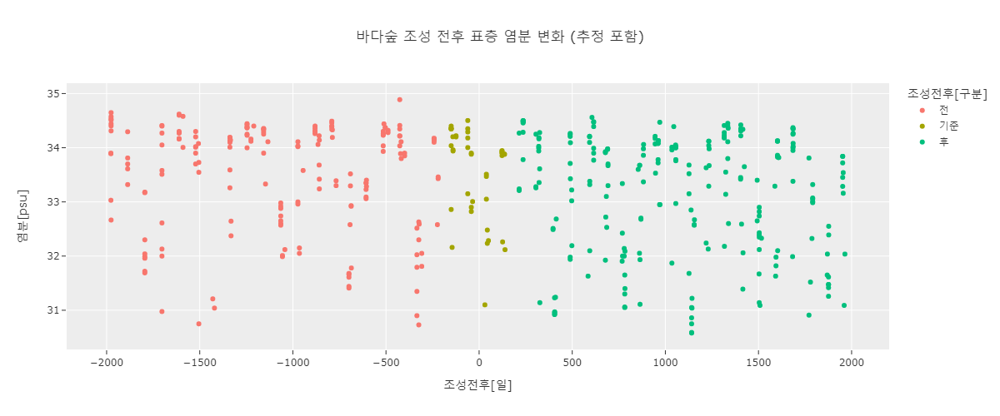

,0,1,2
조성전후[구분],전,기준,후
염분[psu],33.490459,33.554745,33.12962


염분[psu] 변동 : -1.077%


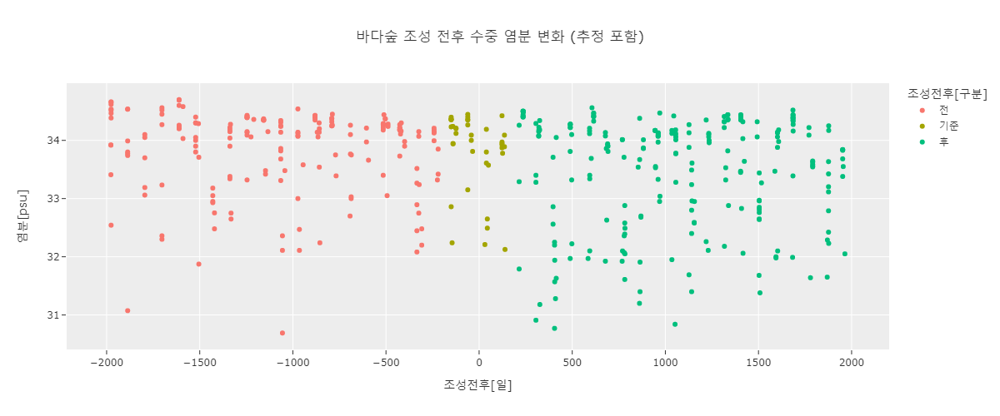

,0,1,2
조성전후[구분],전,기준,후
염분[psu],33.830615,33.8267,33.444925


염분[psu] 변동 : -1.14%

수온[℃]


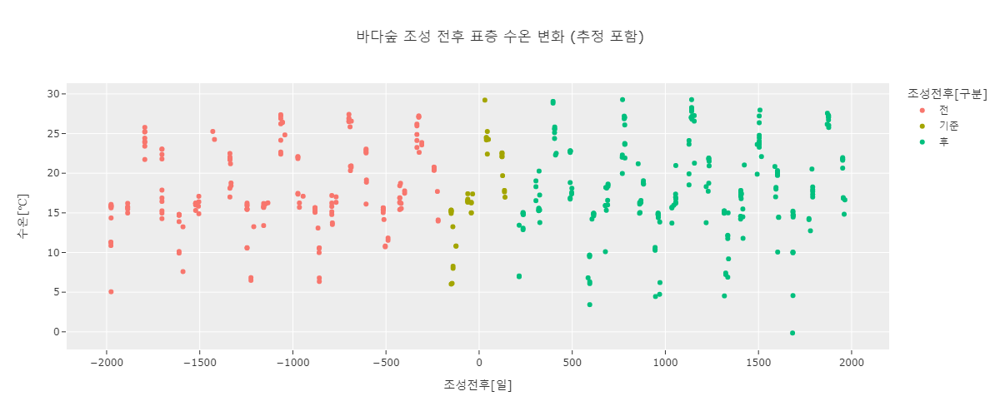

,0,1,2
조성전후[구분],전,기준,후
수온[℃],17.985935,17.311487,17.858697


수온[℃] 변동 : -0.707%


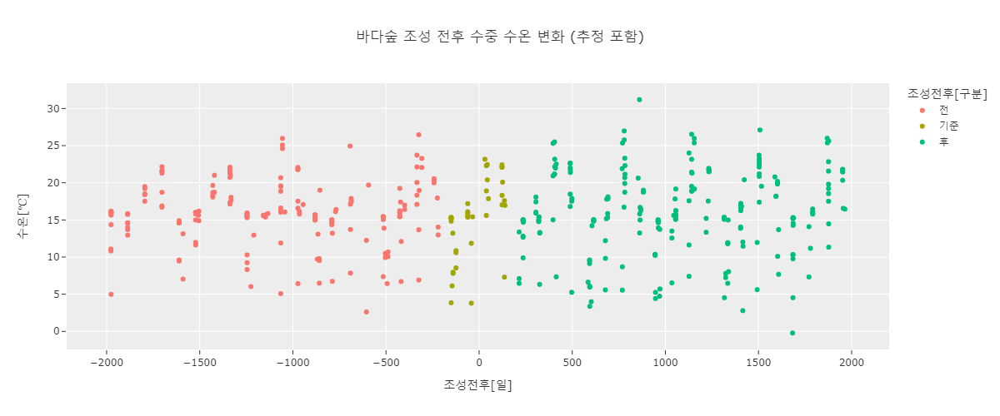

,0,1,2
조성전후[구분],전,기준,후
수온[℃],15.737668,15.164797,15.92851


수온[℃] 변동 : 1.213%

용존산소[mg/L]


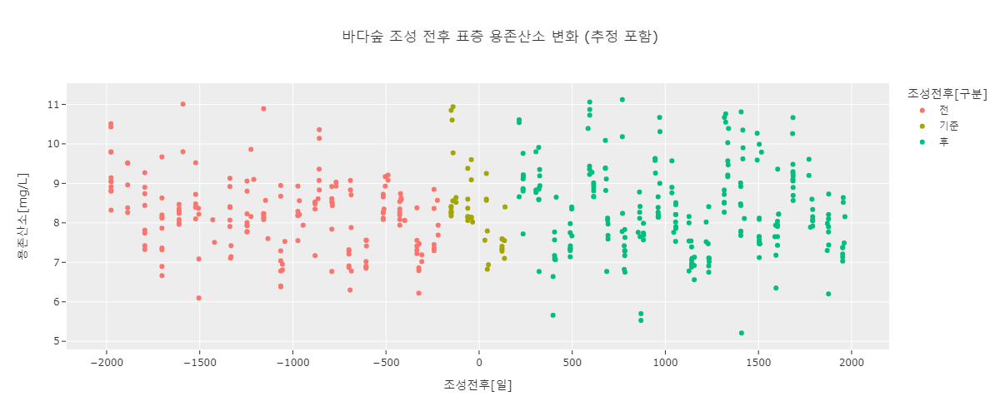

,0,1,2
조성전후[구분],전,기준,후
용존산소[mg/L],8.191349,8.362547,8.334185


용존산소[mg/L] 변동 : 1.744%


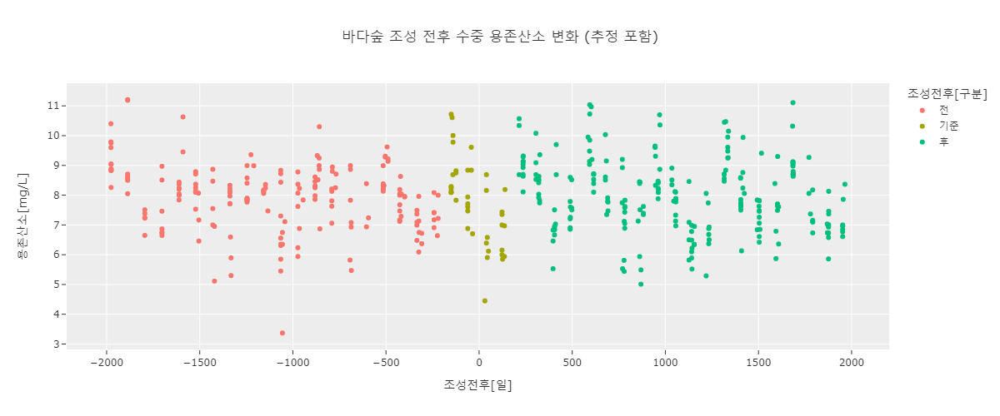

,0,1,2
조성전후[구분],전,기준,후
용존산소[mg/L],7.919016,7.770649,7.976586


용존산소[mg/L] 변동 : 0.727%

In [70]:
for col in rtu_found_df.columns[4:7]:
    CustomUtils.display_htmls('', f'<h2>{col}</h2>', '')
    # 표층
    cond = (rtu_found_df['수심(m)'] == 0.0)
    workdata_df = rtu_found_df[cond]
    title = f'바다숲 조성 전후 표층 {col.split("[")[0]} 변화 (추정 포함)'
    fig = px.scatter(workdata_df, x='조성전후[일]', y=col, color='조성전후[구분]', title=title)
#     fig.show()
    CustomUtils.display_htmls(CustomUtils.jpeg_binary_to_img_src(fig.to_image(format='png', width=1200)))
    bca_sr = workdata_df.groupby('조성전후[구분]')[col].mean().reindex(['전', '기준', '후'])
    CustomUtils.display_htmls('', bca_sr.to_frame().reset_index().T.to_html(), '')
    CustomUtils.display_htmls(f"{col} 변동 : {round((bca_sr['후'] - bca_sr['전']) / bca_sr['전'] * 100, 3)}%")
    
    # 수중
    cond = (rtu_found_df['수심(m)'] > 0.0)
    workdata_df = rtu_found_df[cond]
    title = f'바다숲 조성 전후 수중 {col.split("[")[0]} 변화 (추정 포함)'
    fig = px.scatter(workdata_df, x='조성전후[일]', y=col, color='조성전후[구분]', title=title)
    CustomUtils.display_htmls(CustomUtils.jpeg_binary_to_img_src(fig.to_image(format='png', width=1200)))
    bca_sr = workdata_df.groupby('조성전후[구분]')[col].mean().reindex(['전', '기준', '후'])
    CustomUtils.display_htmls('', bca_sr.to_frame().reset_index().T.to_html(), '')
    CustomUtils.display_htmls(f"{col} 변동 : {round((bca_sr['후'] - bca_sr['전']) / bca_sr['전'] * 100, 3)}%")
    print()


이상의 분석 중, 5% 이상 변동을 보인 항목은 없었습니다.

# 4. 개선안 및 제안

## 4.1 개선안

1)  JOISS에서 (데이터 > 관측자료 검색 > 데이터 입력)시 대소문자가 구분되면서 검색이 어려운 점이 있습니다. 대소문자를 구분하지 않고 검색이 가능하다면 더욱 편리하리라 생각합니다.

2) 특정 자료들에서 기간에 따라 관측 열 명이 다른 데이터가 있습니다. 이로 인해 여러기간의 데이터를 병합하여 사용함에 있어 같은 관측 열 명으로 인식하지 못해 문제가 발견되었습니다. 주로 단위의 차이에서 발생하였으며, 단위가 일원화되면 해소될 것으로 예상합니다.

3) 수심(m)와 깊이(m) 처럼 비슷한 데이터가 혼재되어 있는데 이 값 들이 무엇을 의미하는지 알기가 어려웠습니다. 메타데이터에 설명이 있다면 빠른 이해에 도움이 될 것으로 생각합니다.

4) 자료들이 지속적으로 이어져온 연구가 많지 않은것 같습니다. 많은 데이터들이 약 3~4년 정도 데이터를 수집하다가 멈추었고 장기간에 걸쳐 지속적으로 수집되는 데이터가 적은 것 같습니다. 해양 데이터가 더 많이, 그리고 지속적으로 수집된다면 활용도가 높아질 것으로 생각합니다.

5) JOISS에서 (데이터 > 관측자료 검색 > 데이터 입력) 후 Enter로 검색이 되지 않습니다. 사소한 불편함으로 간주될 수도 있겠으나, 실제 사용하면서 팀원 모두가 불편함을 가장 크게 느꼈던 점으로, 해소된다면 UX에 큰 개선이 될 것이라고 믿습니다.

6) JOISS에서 해양교육자료집 탭에 있는 교육 자료들이 많은 도움이 되었습니다. 특히나 JOISS를 활용하여 교과학습을 수행하는 점은 아이디어 면에서도 너무 좋았습니다. 다만 홍보가 너무 안되고 있다는 생각이 들었습니다. 학교나 교육기관에서 적극적으로 해당 자료를 사용하여 학습에 도움을 줄 수 있었으면 좋겠습니다. 또한, 학생들 뿐 아니라 해양환경에 관심이 있는 일반인들도 JOISS에 접근하여 자료를 통해 학습할 수 있고 활용할 수 있는 간단한 컨텐츠 등의 제작도 괜찮을 것 같습니다.

7) JOISS의 교육탭에 있는 SEALAB은 내용도 좋고 위에서 언급했던 일반인을 위한 간단한 컨텐츠도 있고, 데이터분석가들이 좋아할만한 컨텐츠 등 내용이 좋습니다. 하지만 홍보가 되지 않아 해당 SEALAB이 무엇을 하는곳인지 얼핏 알기 쉽지 않습니다. 또한, SEALAB에 접속하여 포스트탭을 누르면 1주일이내 업로드 페이지가 나와 자칫 1주일 안에 컨텐츠가 없으면 작성된 글이 없다고 뜹니다. 그렇기에 처음 페이지에서 전체 작성내역이 나오게하고, 홍보도 잘 되었으면 합니다.
 

## 4.2 제안

1) 해저 드론을 활용한 무인 탐사 운용
- 배경 : 이번 공모전을 진행하며 가장 힘들었던 점은 물리적 공간에 비해 데이터가 매우 부족한 것이었습니다.
- 원인 : 해양은 육지에 비해 관측점 설치 또는 유인 탐사가 어렵고 비용도 높기 때문으로 추정됩니다.
- 제안 : 이에 최신 과학기술을 활용하여 무인 탐사를 수행하는 해저 드론을 적극적으로 운용하는 것을 제안합니다.

## 4.3 참조문헌 

- 수산자원의 요람, 바다생태계의 중심 ‘바다숲’,정영훈 한국수산자원관리공단 이사장,http://www.hdhy.co.kr/news/articleView.html?idxno=6857 
- 어장 생태환경 개선사업, 한국수산자원공단, https://www.fira.or.kr/fira/fira_030302.jsp
- [2019_바다숲조성관리사업]최종보고서_통합, 한국수산자원공단
- HEP를 이용한 바다숲 조성해역의 적지선정기법, 오태건·이문옥·김창길·김대권·조재권, 2010년 한국마린엔지니어링학회 공동학술대회 논문집
- 바다숲 조성 현황과 전망, 최옥인·최임호·이영원(한국수산자원관리공단)·김종규(전남대학교), 2015 한국 해양환경·에너지학회 추계학술대회
- 서식지 평가 방법을 이용한 바다숲 조성 해역의 적지 선정, 오태건·김이청·양용수·김창길·이문옥, 한국마린엔지니어링학회지 제34권 제6호


# 5 결론

저희의 결론은 바다숲 설치 전과 후의 환경변화는 질소에서 차이가 보였습니다. 
또한, 화학적 산소요구량이 증가하였습니다.
총인의 경우도 많이 감소하였음을 보일 수 있습니다. 
이와 같은 분석 결과를 통해, 많은 부분에서 극명한 차이를 나타내지는 않지만, 많은 부분에서 미약하나마 개선되어가고 있음을 보여주었습니다.

팀 "바다레인저"가 준비한 분석은 여기까지입니다.

감사합니다.